# <font color = blue>EDA Case Study</font>

The loan providing companies find it hard to give loans to the people due to their insufficient or non-existent credit history. Because of that, some consumers use it as their advantage by becoming a defaulter. 

When the company receives a loan application, the company has to decide for loan approval based on the applicant’s profile. Two types of risks are associated with the bank’s decision:
1. If the applicant is likely to repay the loan, then not approving the loan results in a loss of business to the company,
2. If the applicant is not likely to repay the loan, i.e. he/she is likely to default, then approving the loan may lead to a financial loss for the company. 

So using EDA we need to analyze the driving factors (or driver variables) behind loan default, i.e. the variables which are strong indicators of default. The company can utilize this knowledge for its portfolio and risk assessment

### 1. Data Reading

#### 1.1 Importing libraries

In [1]:
# Filtering out the warnings

import warnings

warnings.filterwarnings('ignore')

In [2]:
# Importing the required libraries

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [3]:
# Making sure that we see all rows and columns, since in newer editions python does not show all data by default

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

#### 1.2 Reading the data and its checking its metrics 

In [4]:
# Reading the dataset into pandas dataframe

curapp = pd.read_csv('application_data.csv')

In [5]:
# Checking the top 5 rows of 'application_data' dataset

curapp.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [6]:
# checking the shape of datasets

curapp.shape

(307511, 122)

In [7]:
# checking the summary of datasets

curapp.info(verbose=True, null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 122 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   SK_ID_CURR                    307511 non-null  int64  
 1   TARGET                        307511 non-null  int64  
 2   NAME_CONTRACT_TYPE            307511 non-null  object 
 3   CODE_GENDER                   307511 non-null  object 
 4   FLAG_OWN_CAR                  307511 non-null  object 
 5   FLAG_OWN_REALTY               307511 non-null  object 
 6   CNT_CHILDREN                  307511 non-null  int64  
 7   AMT_INCOME_TOTAL              307511 non-null  float64
 8   AMT_CREDIT                    307511 non-null  float64
 9   AMT_ANNUITY                   307499 non-null  float64
 10  AMT_GOODS_PRICE               307233 non-null  float64
 11  NAME_TYPE_SUITE               306219 non-null  object 
 12  NAME_INCOME_TYPE              307511 non-nu

Here looking at the dataset, there are certainly large number of columns with missing values, so we will deal with it later in the analysis,
Also we can notice that there are no wrong or incorrect data types, all columns whcih are supposed to be categorical have dtype as object, while all numerical columns have int or float as datatype.

In [8]:
# checking the Numerical-summary of datasets

curapp.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,104582.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307509.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,134133.000000,3.068510e+05,246546.000000,151450.00000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,159080.000000,306490.000000,306490.000000,306490.000000,306490.000000,307510.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.00000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,-4986.120328,-2994.202373,12.061091,0.999997,0.819889,0.199368,0.998133,0.281066,0.056720,2.152665,2.052463,2.031521,12.063419,0.015144,0.050769,0.040659,0.078173,0.230454,0.179555,0.502130,5.143927e-01,0.510853,0.11744,0.088442,0.977735,0.752471,0.044621,0.078942,0.149725,0.226282,0.231894,0.066333,0.100775,0.107399,0.008809,0.028358,0.114231,0.087543,0.977065,0.759637,0.042553,0.074490,0.145193,0.222315,0.228058,0.064958,0.105645,0.105975,0.008076,0.027022,0.117850,0.087955,0.97

### 2. Data Cleaning

#### 2.1 Dealing with Missing data   A.K.A   Null values

##### 2.1.1 Removing the columns with more than 40% missing values

In [9]:
# Checking for Percent of null values for each column in the dataset

((curapp.isnull().sum()/curapp.shape[0])*100).sort_values(ascending = False)

COMMONAREA_MEDI                 69.872297
COMMONAREA_AVG                  69.872297
COMMONAREA_MODE                 69.872297
NONLIVINGAPARTMENTS_MODE        69.432963
NONLIVINGAPARTMENTS_MEDI        69.432963
NONLIVINGAPARTMENTS_AVG         69.432963
FONDKAPREMONT_MODE              68.386172
LIVINGAPARTMENTS_MEDI           68.354953
LIVINGAPARTMENTS_MODE           68.354953
LIVINGAPARTMENTS_AVG            68.354953
FLOORSMIN_MEDI                  67.848630
FLOORSMIN_MODE                  67.848630
FLOORSMIN_AVG                   67.848630
YEARS_BUILD_MEDI                66.497784
YEARS_BUILD_AVG                 66.497784
YEARS_BUILD_MODE                66.497784
OWN_CAR_AGE                     65.990810
LANDAREA_MODE                   59.376738
LANDAREA_AVG                    59.376738
LANDAREA_MEDI                   59.376738
BASEMENTAREA_MEDI               58.515956
BASEMENTAREA_AVG                58.515956
BASEMENTAREA_MODE               58.515956
EXT_SOURCE_1                    56

As we can see above that there are numerous columns with `larger percentage of null values`, these columns does not contain enough information to draw insights, and in doing we so may harm our analysis by providing inadequate knowledge pertaining to significant amount of missing data, so its better to `drop them`.

In [10]:
def rem40(x):                                           # Defining our custom function for handling missing values
    for i in x.columns:                                 # Iterating over each column name in our dataset 
        if ((x[i].isnull().sum()/x.shape[0])*100) > 40: # Checking wether the percenatge of those null vales is grearter than 40 
            x.drop(i,axis = 1,inplace = True)           # If yes, we would drop the column else will repeat check for next one 

In [11]:
rem40(curapp) # Applying our custom defined fuction on the dataset

In [12]:
curapp.shape # As we can see our function has removed 49 columns which contained > 40% null values

(307511, 73)

In [13]:
# Here we can see that our function has worked succesfully

((curapp.isnull().sum()/curapp.shape[0])*100).sort_values(ascending = False )

OCCUPATION_TYPE                31.345545
EXT_SOURCE_3                   19.825307
AMT_REQ_CREDIT_BUREAU_YEAR     13.501631
AMT_REQ_CREDIT_BUREAU_MON      13.501631
AMT_REQ_CREDIT_BUREAU_WEEK     13.501631
AMT_REQ_CREDIT_BUREAU_DAY      13.501631
AMT_REQ_CREDIT_BUREAU_HOUR     13.501631
AMT_REQ_CREDIT_BUREAU_QRT      13.501631
NAME_TYPE_SUITE                 0.420148
OBS_30_CNT_SOCIAL_CIRCLE        0.332021
DEF_30_CNT_SOCIAL_CIRCLE        0.332021
OBS_60_CNT_SOCIAL_CIRCLE        0.332021
DEF_60_CNT_SOCIAL_CIRCLE        0.332021
EXT_SOURCE_2                    0.214626
AMT_GOODS_PRICE                 0.090403
AMT_ANNUITY                     0.003902
CNT_FAM_MEMBERS                 0.000650
DAYS_LAST_PHONE_CHANGE          0.000325
NAME_INCOME_TYPE                0.000000
FLAG_OWN_REALTY                 0.000000
TARGET                          0.000000
FLAG_EMAIL                      0.000000
FLAG_PHONE                      0.000000
FLAG_CONT_MOBILE                0.000000
NAME_CONTRACT_TY

We can see that the column with name `Occupation_Type` has about `31% missing/null values`, we `cannot drop` that column as it stil contains about 70% of relevant information, also we `cannot impute` the same as doing so may create data imbalance and bias, while there are certain techniques like logistic regression that can be used here, but for the sake of our anlysis we would keep things as they are in this particular column since they won't be affecting our analysis, same stands for column `EXT_SOURCE_3`.

#### 2.1.2     Imputing null values in columns with relevant data if they contain the null values less than 15%

So, as for columns with missing values `less than 15%`, ideal scenario would be to `impute` them by `mode in case of categorical` columns and `median` (or any other relevant aspect of central tendency) for `numerical` columns although we would be using median as it is relatively less affected by outliers.

In [14]:
# To check for various datatypes associated with columns consisiting the percentage of null values between 0 and 15


for i in curapp.columns:   # Itetrating over all column names
    if ((curapp[i].isnull().sum()/curapp.shape[0])*100) > 0 and ((curapp[i].isnull().sum()/curapp.shape[0])*100) < 15:  #checking if satisfy our condition specified above
            print(i,' '*20,[curapp[i].dtype]) # if yes display the  column name along with thier respective datatypes 

AMT_ANNUITY                      [dtype('float64')]
AMT_GOODS_PRICE                      [dtype('float64')]
NAME_TYPE_SUITE                      [dtype('O')]
CNT_FAM_MEMBERS                      [dtype('float64')]
EXT_SOURCE_2                      [dtype('float64')]
OBS_30_CNT_SOCIAL_CIRCLE                      [dtype('float64')]
DEF_30_CNT_SOCIAL_CIRCLE                      [dtype('float64')]
OBS_60_CNT_SOCIAL_CIRCLE                      [dtype('float64')]
DEF_60_CNT_SOCIAL_CIRCLE                      [dtype('float64')]
DAYS_LAST_PHONE_CHANGE                      [dtype('float64')]
AMT_REQ_CREDIT_BUREAU_HOUR                      [dtype('float64')]
AMT_REQ_CREDIT_BUREAU_DAY                      [dtype('float64')]
AMT_REQ_CREDIT_BUREAU_WEEK                      [dtype('float64')]
AMT_REQ_CREDIT_BUREAU_MON                      [dtype('float64')]
AMT_REQ_CREDIT_BUREAU_QRT                      [dtype('float64')]
AMT_REQ_CREDIT_BUREAU_YEAR                      [dtype('float64')]


Before we begin imputing if we were to look at columns `[AMT_REQ_CREDIT_BUREAU_HOUR, AMT_REQ_CREDIT_BUREAU_DAY, AMT_REQ_CREDIT_BUREAU_WEEK, AMT_REQ_CREDIT_BUREAU_MON, AMT_REQ_CREDIT_BUREAU_QRT, AMT_REQ_CREDIT_BUREAU_YEAR]` we should notice that they hold value-counts so it won't be justice to impute median in them, rather we should go with mode. 

In [15]:
# Checking for count of each value in column `AMT_REQ_CREDIT_BUREAU_HOUR `

curapp['AMT_REQ_CREDIT_BUREAU_HOUR'].value_counts()

0.0    264366
1.0      1560
2.0        56
3.0         9
4.0         1
Name: AMT_REQ_CREDIT_BUREAU_HOUR, dtype: int64

In [16]:
# Itetrating over the following columns to fill thier missing values with mode as discussed above 


for i in ['AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR']:
    curapp[i] = curapp[i].fillna(curapp[i].mode()[0])

Now to begin imputing, we would impute categorical columns with mode and numerical with median, we will do so by forming our own custom function whoose task is to -: 
- Itetrate over all columns and check 
- if they contain null values percentage `less than 15%`
- if yes, we would see wether they are of dtype, `object` , in which case we would replace null values with `mode`
- else, that would mean that they are either of `float` or `int` datatype, since those are only type of column that exists in our     dataset, in that case we would simply fill those null values with `median`

In [17]:
def imp15(x):                       # Preparing our custom function as discussed above
    for i in x.columns:
        if ((x[i].isnull().sum()/x.shape[0])*100) < 15:
            if x[i].dtype == 'object':
                x[i] = x[i].fillna(x[i].mode()[0])
            else:
                x[i] = x[i].fillna(x[i].median())

In [18]:
imp15(curapp) # Applying our custom function on the dataset

In [19]:
# Again checking % of null values in each column, and as we can see our function works flawlessly

((curapp.isnull().sum()/curapp.shape[0])*100).sort_values(ascending = False)  

OCCUPATION_TYPE                31.345545
EXT_SOURCE_3                   19.825307
FLAG_EMAIL                      0.000000
DAYS_ID_PUBLISH                 0.000000
FLAG_MOBIL                      0.000000
FLAG_EMP_PHONE                  0.000000
FLAG_WORK_PHONE                 0.000000
FLAG_CONT_MOBILE                0.000000
FLAG_PHONE                      0.000000
AMT_REQ_CREDIT_BUREAU_YEAR      0.000000
DAYS_EMPLOYED                   0.000000
CNT_FAM_MEMBERS                 0.000000
REGION_RATING_CLIENT            0.000000
REGION_RATING_CLIENT_W_CITY     0.000000
WEEKDAY_APPR_PROCESS_START      0.000000
HOUR_APPR_PROCESS_START         0.000000
REG_REGION_NOT_LIVE_REGION      0.000000
DAYS_REGISTRATION               0.000000
DAYS_BIRTH                      0.000000
LIVE_REGION_NOT_WORK_REGION     0.000000
REGION_POPULATION_RELATIVE      0.000000
TARGET                          0.000000
NAME_CONTRACT_TYPE              0.000000
CODE_GENDER                     0.000000
FLAG_OWN_CAR    

##### 2.2 Performing Sanity checks on our dataset

In [20]:
# we will remove unwanted columns from this data set, since most of these columns would only act as noise and our dataset in large enough 

unwanted=['FLAG_MOBIL','FLAG_EMP_PHONE','FLAG_WORK_PHONE','FLAG_CONT_MOBILE', 'FLAG_PHONE','FLAG_EMAIL','REGION_RATING_CLIENT','REGION_RATING_CLIENT_W_CITY','FLAG_EMAIL','CNT_FAM_MEMBERS','REGION_RATING_CLIENT','REGION_RATING_CLIENT_W_CITY','DAYS_LAST_PHONE_CHANGE','FLAG_DOCUMENT_2','FLAG_DOCUMENT_3','FLAG_DOCUMENT_4','FLAG_DOCUMENT_5','FLAG_DOCUMENT_6','FLAG_DOCUMENT_7','FLAG_DOCUMENT_8','FLAG_DOCUMENT_9','FLAG_DOCUMENT_10','FLAG_DOCUMENT_11','FLAG_DOCUMENT_12','FLAG_DOCUMENT_13','FLAG_DOCUMENT_14','FLAG_DOCUMENT_15','FLAG_DOCUMENT_16','FLAG_DOCUMENT_17','FLAG_DOCUMENT_18','FLAG_DOCUMENT_19','FLAG_DOCUMENT_20','FLAG_DOCUMENT_21']
curapp.drop(labels=unwanted,axis=1,inplace=True) 

There are some columns where the value is mentioned as 'XNA' which means 'Not Avaliable'.so we have to find the number of rows and columns and implement suitable techniques on them to fill those missing values or to delete them.

In [21]:
#let's find these categorical columns having 'XNA' values

# For Gender Column

curapp['CODE_GENDER'].value_counts()

F      202448
M      105059
XNA         4
Name: CODE_GENDER, dtype: int64

So,there are 4 rows from Gender column having 'XNA'
Since, Female is having the majority and only 4 rows are having NA values, we can update those columns with Gender 'F' as there will be no impact on the dataset.

In [22]:
# FOR Organisation column

curapp['ORGANIZATION_TYPE'].value_counts()

Business Entity Type 3    67992
XNA                       55374
Self-employed             38412
Other                     16683
Medicine                  11193
Business Entity Type 2    10553
Government                10404
School                     8893
Trade: type 7              7831
Kindergarten               6880
Construction               6721
Business Entity Type 1     5984
Transport: type 4          5398
Trade: type 3              3492
Industry: type 9           3368
Industry: type 3           3278
Security                   3247
Housing                    2958
Industry: type 11          2704
Military                   2634
Bank                       2507
Agriculture                2454
Police                     2341
Transport: type 2          2204
Postal                     2157
Security Ministries        1974
Trade: type 2              1900
Restaurant                 1811
Services                   1575
University                 1327
Industry: type 7           1307
Transpor

So,there are 55374 rows from Organization type column So, for column 'ORGANIZATION_TYPE', we have total count of 307511 rows of which 55374 rows are having 'XNA' values. so we need to replace those with NaN or null values.

In [23]:
# Updating the column 'CODE_GENDER' with "F" for the dataset

curapp.loc[curapp['CODE_GENDER']=='XNA','CODE_GENDER']='F'
curapp['CODE_GENDER'].value_counts()

F    202452
M    105059
Name: CODE_GENDER, dtype: int64

In [24]:
# Hence, Updating the rows of total 55374 having 'XNA' values in the organization type column to NaN

curapp=curapp.replace('XNA',np.NaN)

In [25]:
# Casting all variable into numeric in the dataset

numeric_columns=['TARGET','CNT_CHILDREN','AMT_INCOME_TOTAL','AMT_CREDIT','AMT_ANNUITY','REGION_POPULATION_RELATIVE','DAYS_BIRTH','DAYS_EMPLOYED','DAYS_REGISTRATION','DAYS_ID_PUBLISH','HOUR_APPR_PROCESS_START','LIVE_REGION_NOT_WORK_REGION','REG_CITY_NOT_LIVE_CITY','REG_CITY_NOT_WORK_CITY','LIVE_CITY_NOT_WORK_CITY']
curapp[numeric_columns]=curapp[numeric_columns].apply(pd.to_numeric)
curapp.head(5)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,Laborers,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,2.0,2.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,Core staff,MONDAY,11,0,0,0,0,0,0,School,0.622246,NaN,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,Laborers,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.729567,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,-3039,-9833.0,-2437,Laborers,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.650442,NaN,2.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,-3038,-4311.0,-3458,Core staff,THURSDAY,11,0,0,0,0,1,1,Religion,0.322738,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Now, when we look at the columns ['DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH'] which contains `days before` for certain aspects which the applicant possesed the moment they applied for a loan.

here all the values are in `negative`, which signifies days before but really it isn't neccecary and it makes codes more difficult to read so we would take care of it by converting all those values in the `absolute form`.

Also it would be more readable if these values are scaled in a more feasible manner, as in `years instead of days`.

while we may change the scale there is no need to change the format of any of these particular since they don't point to any significant event.


In [26]:
for i in curapp.columns:     # Using the for loop to convert each column containig 'DAYS' into its absolute from 
    if 'DAYS' in i:
        curapp[i] = abs(curapp[i])

In [27]:
curapp[['DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH']].head() 

# Sucessfully converted into absolute form

,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH
0,9461,637,3648.0,2120
1,16765,1188,1186.0,291
2,19046,225,4260.0,2531
3,19005,3039,9833.0,2437
4,19932,3038,4311.0,3458


As we can se we have successfully acomplished the task of converting into absolute value,
Now we will convert all these particulars to years.

For that we would :
- First iterate over all columns and check wether they contain 'DAYS' in them, if yes
- then we will simply divide them by `365` and then round off to 1 digit after decimal.

In [28]:
for i in curapp.columns:   # First iterate over all columns and check wether they contain 'DAYS' in them, if yes
    if 'DAYS' in i:
        curapp[i] = round(curapp[i]/365,1)
curapp[['DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH']].head()   # We will divide by 365

,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH
0,25.9,1.7,10.0,5.8
1,45.9,3.3,3.2,0.8
2,52.2,0.6,11.7,6.9
3,52.1,8.3,26.9,6.7
4,54.6,8.3,11.8,9.5


As we can see we have succesfully executed our code, Now we will rename the columns from 'DAYS' to 'YEARS'

In [29]:
curapp.rename(columns = {'DAYS_BIRTH':'YEARS_BIRTH','DAYS_EMPLOYED':'YEARS_EMPLOYED','DAYS_REGISTRATION':'YEARS_REGISTRATION','DAYS_ID_PUBLISH':'YEARS_ID_PUBLISH'},inplace = True)

In [30]:
curapp.describe()   # The Column names has been succesfully changed

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,YEARS_BIRTH,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307511.000000,3.075110e+05,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,3.075110e+05,246546.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.487841,5.383163e+05,0.020868,43.936992,185.553352,13.660553,8.203265,12.063419,0.015144,0.050769,0.040659,0.078173,0.230454,0.179555,5.145034e-01,0.510853,1.417523,0.142944,1.400626,0.099717,0.005538,0.006055,0.029723,0.231293,0.229631,1.643447
std,102790.175348,0.272419,0.722121,2.371231e+05,4.024908e+05,14493.461065,3.692890e+05,0.013831,11.956084,382.050861,9.651947,4.135684,3.265832,0.122126,0.219526,0.197499,0.268444,0.421124,0.383817,1.908699e-01,0.194844,2.398395,0.446033,2.377224,0.361735,0.078014,0.103037,0.190728,0.856810,0.744059,1.855821
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,20.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.173617e-08,0.000527,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.500000,0.000000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,34.000000,2.600000,5.500000,4.700000,10.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.929737e-01,0.370650,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.000000,0.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,43.200000,6.100000,12.300000,8.900000,12.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.659614e-01,0.535276,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,367142.500000,0.000000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,53.900000,15.600000,20.500000,11.800000,14.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.634218e-01,0.669057,2.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000
max,456255.000000,1.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,69.100000,1000.700000,67.600000,19.700000,23.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,8.549997e-01,0.896010,348.000000,34.000000,344.000000,24.000000,4.000000,9.000000,8.000000,27.000000,261.000000,25.000000


#### 2.2.1     Binning or bucketing of continous variables

Since Numerical column pertaining to 'YEARS_BIRTH' is basically continous in nature so we will bin it for better analysis

In [31]:
bins= [18,25,40,60,70]         # Creating the range of bins
slots= ['Under 18', 'Young Adult', 'Middle Age', 'Senior Citizen'] # Creating the name for those bins


curapp['YEARS_BIRTH_RANGE']=pd.cut(curapp['YEARS_BIRTH'], bins = bins, labels = slots)  # Using pd.cut, binning our column

Now, Creating bins for continous variable categories column 'AMT_INCOME_TOTAL' and 'AMT_CREDIT'

In [32]:
# Creating bins for income amount

bins = [0,0.2,0.4,0.6,0.8,1]                                 
slots = ['Very Low', 'Low', "Medium", 'High', 'Very high']


curapp['AMT_INCOME_RANGE']=pd.qcut(curapp['AMT_INCOME_TOTAL'], q = bins , labels = slots)

In [33]:
# Creating bins for Credit amount

bins = [0,0.2,0.4,0.6,0.8,1]
slots = ['Very Low', 'Low', "Medium", 'High', 'Very high']
curapp['AMT_CREDIT_RANGE']= pd.qcut(curapp['AMT_CREDIT'],q=bins,labels=slots)

In [34]:
curapp.head()      # Binning was done sucessfully

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,YEARS_BIRTH,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,YEARS_BIRTH_RANGE,AMT_INCOME_RANGE,AMT_CREDIT_RANGE
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,25.9,1.7,10.0,5.8,Laborers,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,2.0,2.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,1.0,Young Adult,High,Low
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,45.9,3.3,3.2,0.8,Core staff,MONDAY,11,0,0,0,0,0,0,School,0.622246,NaN,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Middle Age,Very high,Very high
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,52.2,0.6,11.7,6.9,Laborers,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.729567,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Middle Age,Very Low,Very Low
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,52.1,8.3,26.9,6.7,Laborers,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.650442,NaN,2.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Middle Age,Low,Low
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,54.6,8.3,11.8,9.5,Core staff,THURSDAY,11,0,0,0,0,1,1,Religion,0.322738,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Middle Age,Low,Medium


In [35]:
# Dividing the dataset into two dataset of target=1(client with payment difficulties i.e Defaulters) and target=0(Non-Defaulter)

target0_curapp=curapp.loc[curapp["TARGET"]==0]
target1_curapp=curapp.loc[curapp["TARGET"]==1]

In [36]:
# Calculating Imbalance Percentage

#Since the majority is target0 and minority is target1

round(len(target0_curapp)/len(target1_curapp),2)

11.39

The Imbalance ratio is 10.55, therefore imbalance is significant

### 3. DATA ANALYSIS 



#### 3.1 Univariate analysis & Outlier Treatment



Lets look at various columns for outliers if any

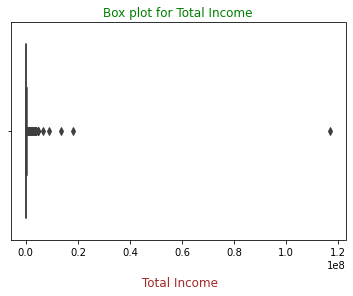

In [37]:
# Box plot for Total income amount

sns.boxplot(curapp.AMT_INCOME_TOTAL) 
plt.title("Box plot for Total Income", fontdict={'fontsize': 12, 'fontweight' : 5, 'color' : 'Green'}) 
plt.xlabel("\n Total Income", fontdict={'fontsize': 12, 'fontweight' : 5, 'color' : 'Brown'})
plt.show()

Here we can obsrerve that one certain person have a very high income, so lets verify the santicty of data

In [38]:
curapp[curapp.AMT_INCOME_TOTAL == curapp.AMT_INCOME_TOTAL.max()] # selecting the particulars of person with highest income  

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,YEARS_BIRTH,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,YEARS_BIRTH_RANGE,AMT_INCOME_RANGE,AMT_CREDIT_RANGE
12840,114967,1,Cash loans,F,N,Y,1,117000000.0,562491.0,26194.5,454500.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.010643,34.6,2.5,18.5,10.0,Laborers,TUESDAY,14,0,0,0,0,0,0,Business Entity Type 3,0.113161,0.145543,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,Young Adult,Very high,Medium


using the index we can the occupation and various particulars of that person, and we noticed that they there must definetly be some mistake so we will rectify it by putting an `upper limit at 25000000`

In [39]:
curapp['AMT_INCOME_TOTAL'] = curapp.AMT_INCOME_TOTAL.clip(0,25000000) # Capping the dataset using `clip`

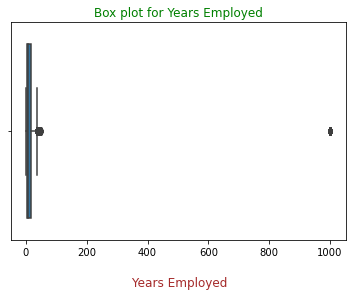

In [40]:
# Box plot for Years Employed

sns.boxplot(curapp.YEARS_EMPLOYED) 
plt.title("Box plot for Years Employed", fontdict={'fontsize': 12, 'fontweight' : 5, 'color' : 'Green'}) 
plt.xlabel("\n Years Employed", fontdict={'fontsize': 12, 'fontweight' : 5, 'color' : 'Brown'})
plt.show()

Here we can obsrerve that one certain person have a very high number of Years Employed > 1000, which is not possible so it must be some kind of mistake, so lets `clip the value to 70`

In [41]:
curapp['YEARS_EMPLOYED'] = curapp.YEARS_EMPLOYED.clip(0,70)

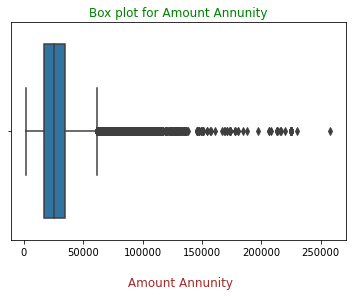

In [42]:
# Box plot for Amount Annuity

sns.boxplot(curapp.AMT_ANNUITY) 
plt.title("Box plot for Amount Annunity", fontdict={'fontsize': 12, 'fontweight' : 5, 'color' : 'Green'}) 
plt.xlabel("\n Amount Annunity", fontdict={'fontsize': 12, 'fontweight' : 5, 'color' : 'Brown'})
plt.show()

There are certainly many outliers but nothing beyond the scope of normal.

###### Now, doing Categorical Univariate Analysis in logarithmic scale for target=0(client with no payment difficulties)

In [43]:
IPython_default = plt.rcParams.copy()

In [44]:
# Count plotting in logarithmic scale

def uniplot(curapp,col,title,hue = None):
    
   
    sns.set_style('whitegrid')
    sns.set_context('talk')
    plt.rc('axes', labelsize = 20)
    plt.rc('axes', titlesize = 22)
    plt.rc('axes', titlepad = 30)
    
    temp = pd.Series(data = hue)
    fig, ax = plt.subplots()
    width = len(curapp[col].unique()) + 7 + 4*len(temp.unique())
    fig.set_size_inches(width, 8)
    plt.xticks(rotation=45)
    plt.yscale('log')
    plt.title(title)
    ax = sns.countplot(data = curapp, x = col, order=curapp[col].value_counts().index,hue = hue,palette='magma')
    
    
    
    plt.show()
    
    

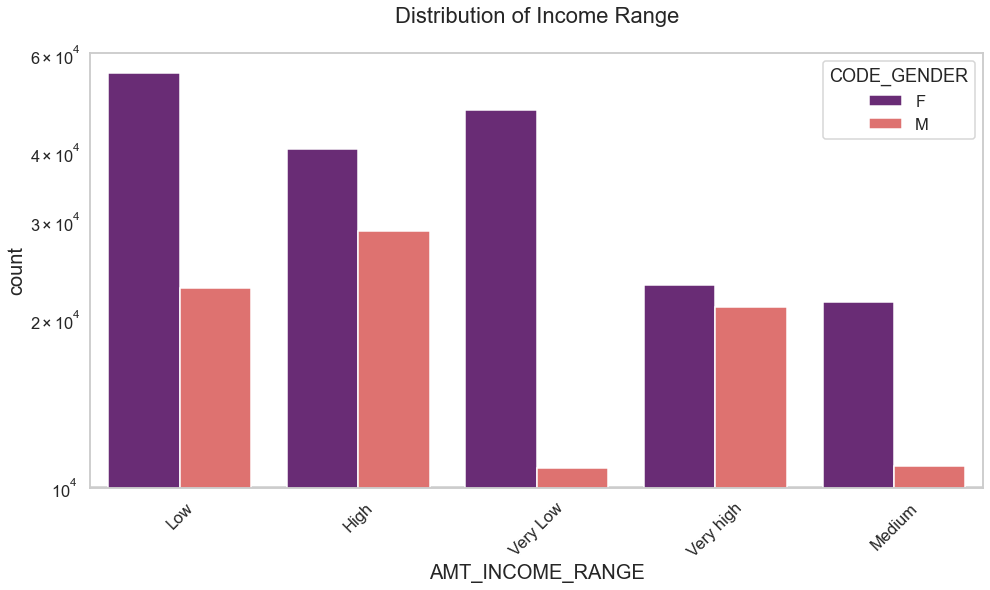

In [45]:
# Plotting for income range

uniplot(target0_curapp,col='AMT_INCOME_RANGE',title='Distribution of Income Range',hue='CODE_GENDER')

Important Points to be concluded from the above graph.

1. Female counts are higher than male
2. Income range from 100000 to 200000 is having more number of credits
3. This graph show that females are more than male in having credits for that range
4. Very less count for income range 400000 and above

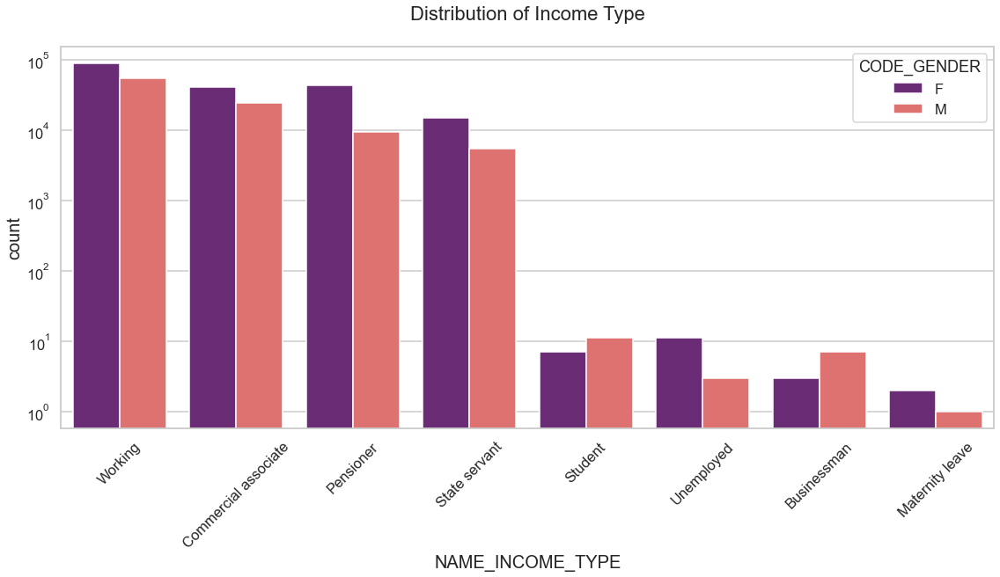

In [46]:
# Plotting for Income type
uniplot(target0_curapp,col='NAME_INCOME_TYPE', title='Distribution of Income Type',hue='CODE_GENDER')

Points to be concluded from the above graph

1. For income type 'working','commercial associate'and 'state servant' the number of credits are higher than others.
2. For this Females are having more number of credits than male
3. Less number of credits for income type 'student','pensioner','Businessman' and 'Maternity leave'

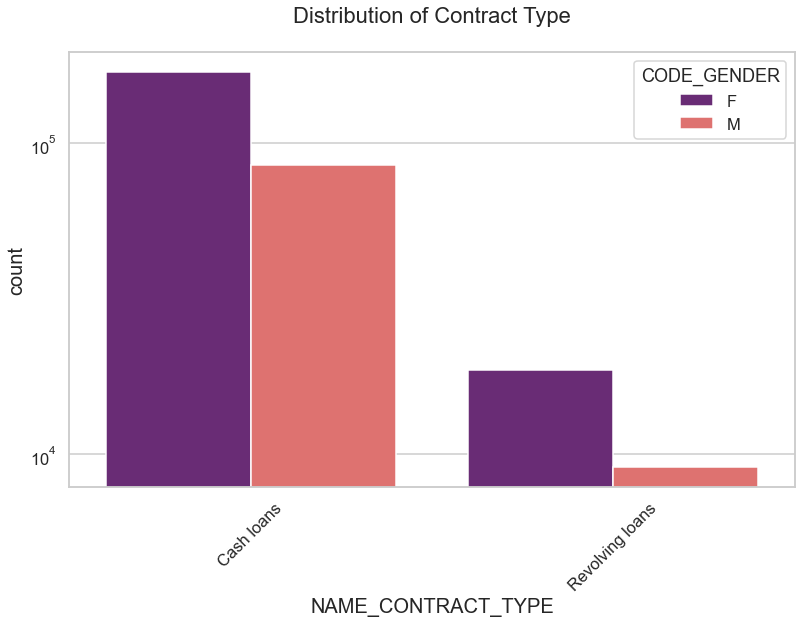

In [47]:
# Plotting for Contract type

uniplot(target0_curapp,col='NAME_CONTRACT_TYPE',title='Distribution of Contract Type',hue='CODE_GENDER')

Points to be concluded from the above graph

1. For contract type 'cash loans' is having higher number of credits than 'Revolving Loans' contract type.
2. For this also Female is leading for applying credits.

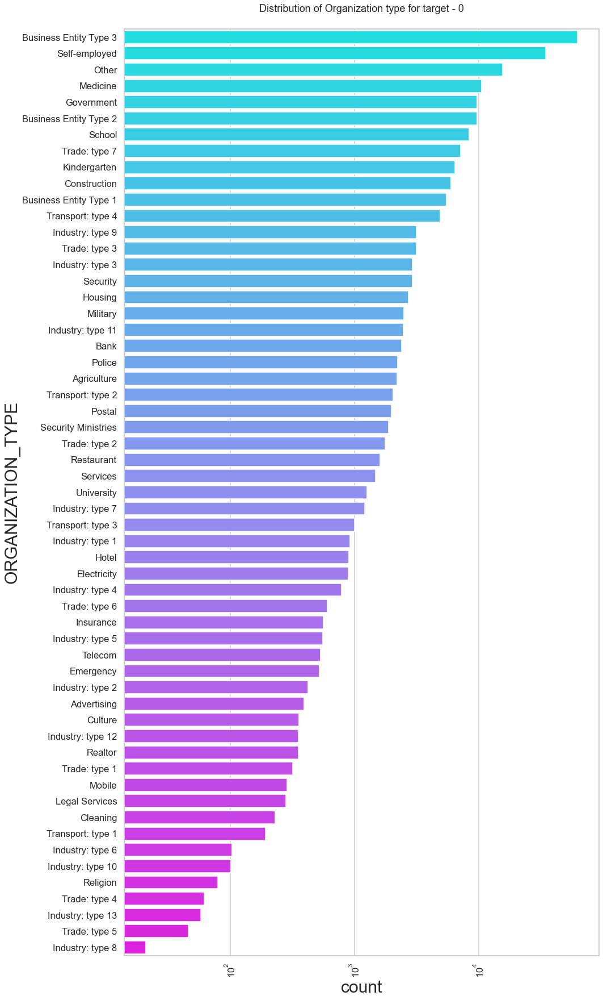

In [48]:
# Plotting for Organization type in logarithimic scale

sns.set_style('whitegrid') 
sns.set_context('talk')
plt.figure(figsize=(15,30))
plt.rc('axes', labelsize = 20)
plt.rc('axes', labelsize = 22)
plt.rc('axes', labelsize = 30)

plt.title("Distribution of Organization type for target - 0")

plt.xticks(rotation=90)
plt.xscale('log')

sns.countplot(data=target0_curapp,y='ORGANIZATION_TYPE',order=target0_curapp['ORGANIZATION_TYPE'].value_counts().index,palette='cool')


plt.show()
    


Points to be concluded from the above graph.

1. Clients which have applied for credits are from most of the organization type 'Business entity Type 3','Self employed','Other','Medicine' and 'Government'.

2. Less clients are from Industry type 8, type 6, type 10, religion and trade type 5, type 4.


 ##### Now, doing Categorical Univariate Analysis in logarithmic scale for target=1(client with payment difficulties)

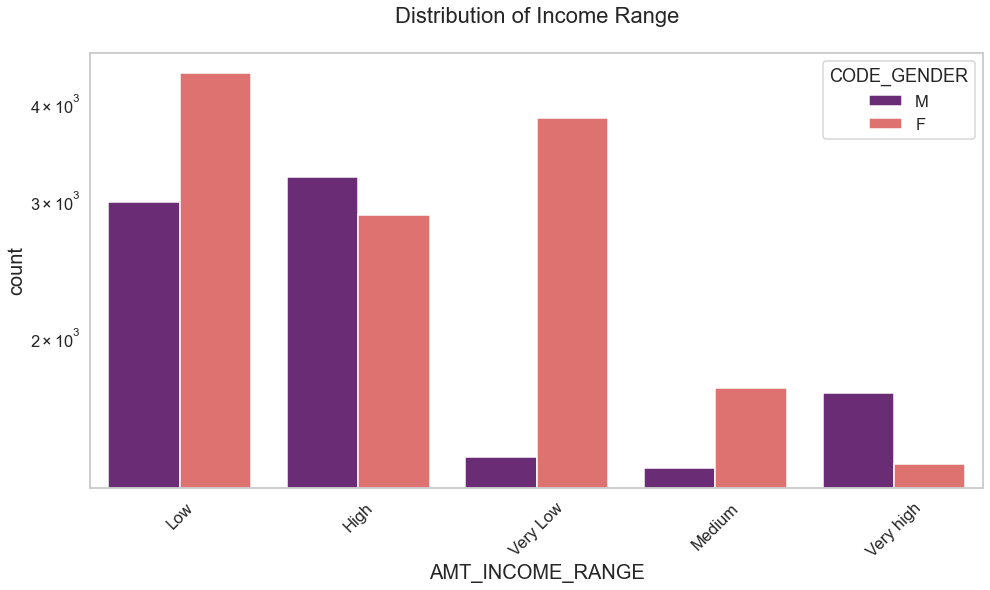

In [49]:
# Plotting for income range

uniplot(target1_curapp,col='AMT_INCOME_RANGE',title='Distribution of Income Range',hue='CODE_GENDER')

Points to be concluded from the above graph.

1. Male counts are higher than female

2. Income Range from 100000 t0 200000 is having more number of credits.

3. This graph show that males are more than female in having credits for that range.

4. Very less count for income range 400000 and above.

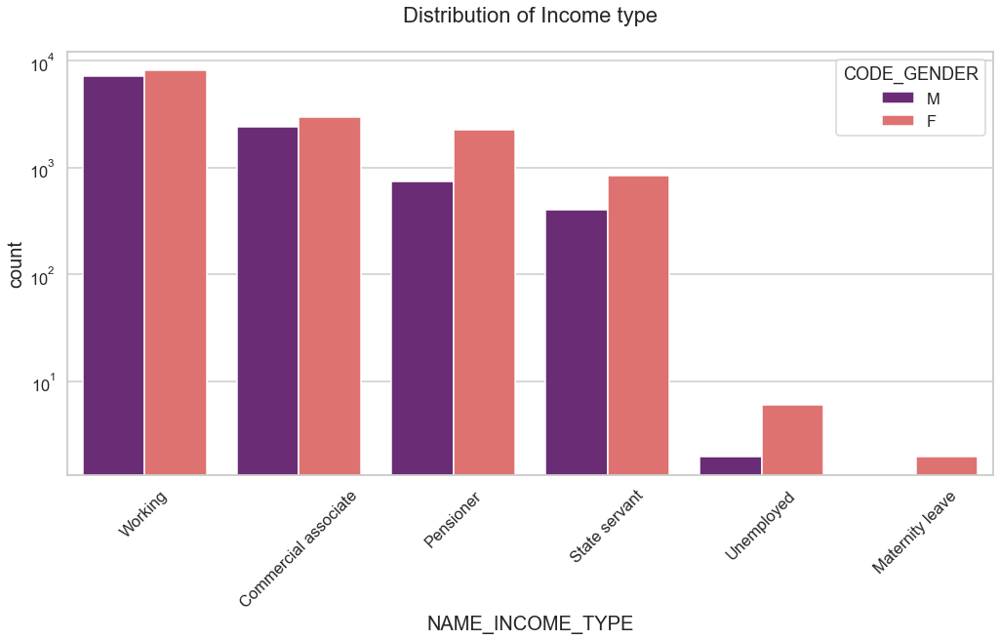

In [50]:
# Plotting for Income type

uniplot(target1_curapp,col='NAME_INCOME_TYPE',title='Distribution of Income type',hue='CODE_GENDER')

points to be concluded from the above graph.

1. For income type 'working','commercial associate' and 'State Servant' the number of credits are higher than other i.e.'Maternity leave'.
 
2. For this Females are having more number of credits than male.

3. Less number of credits for income type 'Maternity leave'.

4. For type 1: There is no income type for 'student','pensioner' and 'Businessman' which means they don't do any late payments.

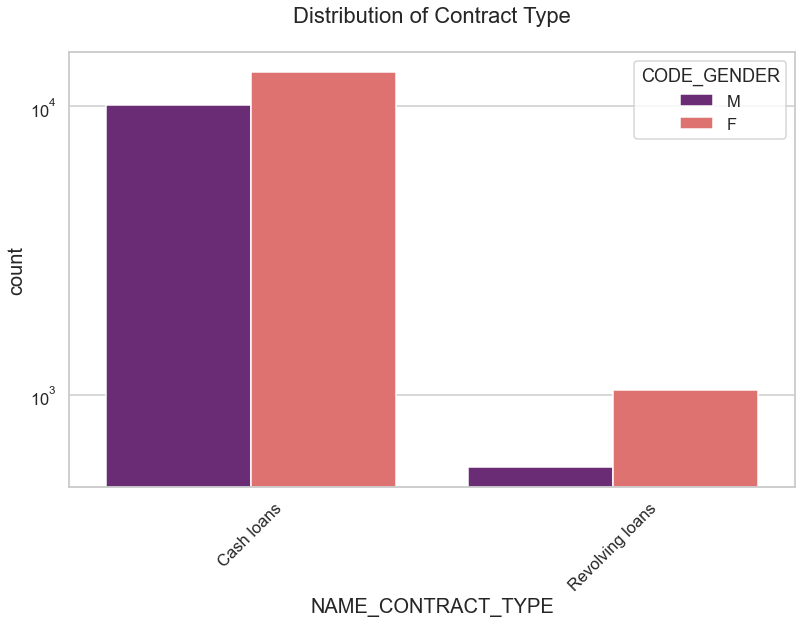

In [51]:
# Plotting for Contract type

uniplot(target1_curapp,col='NAME_CONTRACT_TYPE',title='Distribution of Contract Type',hue='CODE_GENDER')

Points to be concluded from the above graph.

1. For contract type 'cash loans' is having higher number of credits than 'Revolving loans' contract type.

2. For this also Female is leading for applying credits.

3. For type 1 : there is only Female Revolving loans.

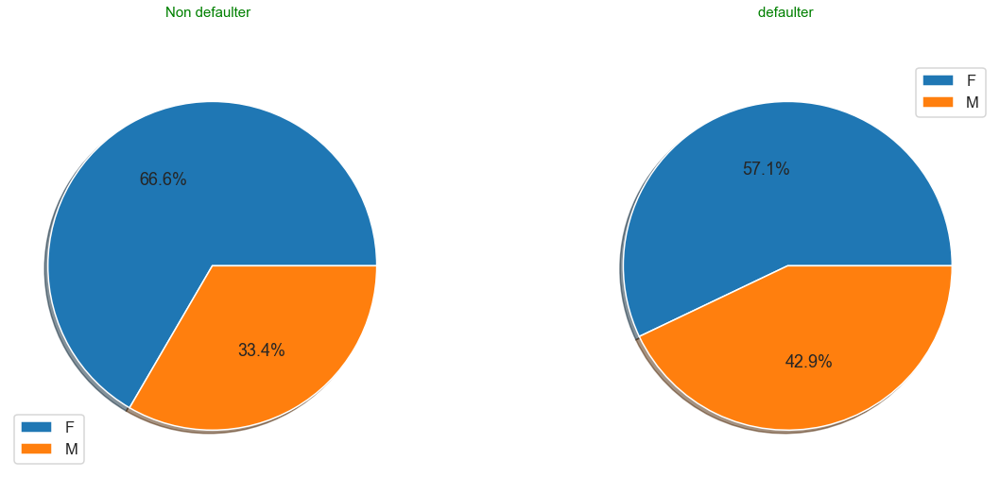

In [52]:
# Gender based percentage of defaulters and non-defaulters

plt.figure(figsize=[20,8])


plt.subplot(1,2,1)
plt.pie(target0_curapp['CODE_GENDER'].value_counts(),shadow=True,autopct='%1.1f%%')
plt.title("Non defaulter  \n", fontdict={'fontsize': 15, 'fontweight' : 5, 'color' : 'Green'})
plt.legend(target0_curapp['CODE_GENDER'].value_counts().index)




plt.subplot(1,2,2)
plt.pie(target1_curapp['CODE_GENDER'].value_counts(),shadow=True,autopct='%1.1f%%')
plt.title("defaulter \n", fontdict={'fontsize': 15, 'fontweight' : 5, 'color' : 'Green'})
plt.legend(target1_curapp['CODE_GENDER'].value_counts().index)
plt.show()

As seen from figure, Females are majority in both Defaulters and Non-Defaulters

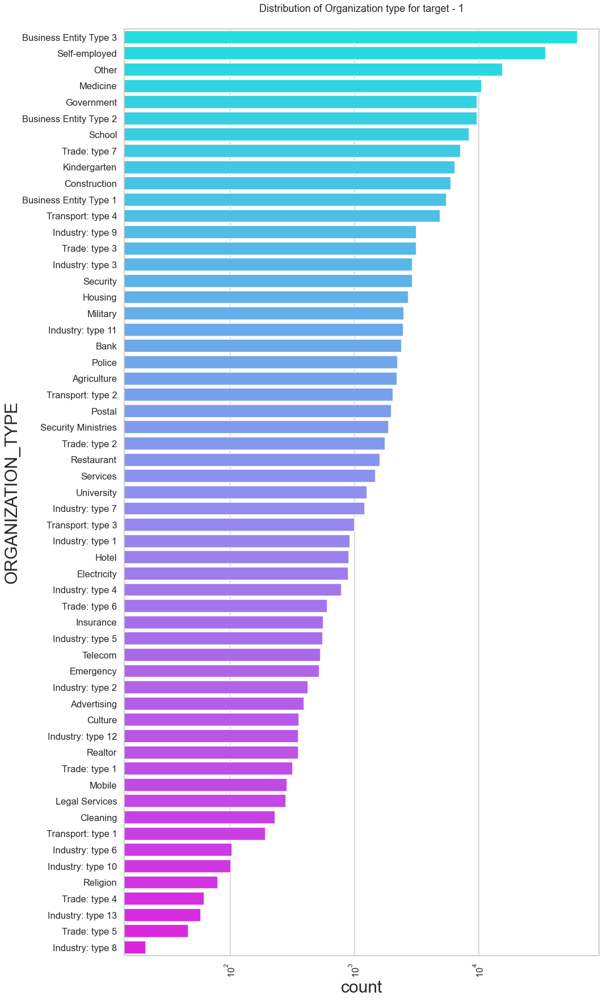

In [53]:
# plotting for Organization type

sns.set_style('whitegrid') 
sns.set_context('talk')
plt.figure(figsize=(15,30))
plt.rc('axes', labelsize = 20)
plt.rc('axes', labelsize = 22)
plt.rc('axes', labelsize = 30)

plt.title("Distribution of Organization type for target - 1")

plt.xticks(rotation=90)
plt.xscale('log')

sns.countplot(data=target0_curapp,y='ORGANIZATION_TYPE',order=target0_curapp['ORGANIZATION_TYPE'].value_counts().index,palette='cool')


plt.show()
    


Points to be concluded from the above graph.

1. Clients which have applied for credits are from most of the Organization type 'Business entity Type 3','Self employed','Other','Medicine'and 'Government'.

2. Less clients are from Industry type 8, type 6, type 10, religion and trade type 5, type 4.

3. Same as type 0 in distribution of organization type.

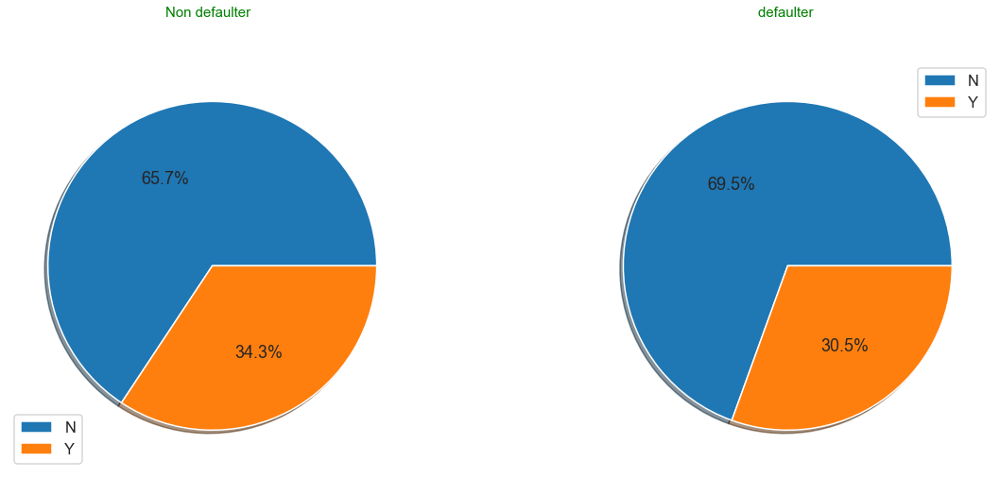

In [54]:
# Car-Owner based percentage of defaulters and non-defaulters

plt.figure(figsize=[20,8])


plt.subplot(1,2,1)
plt.pie(target0_curapp['FLAG_OWN_CAR'].value_counts(),shadow=True,autopct='%1.1f%%')
plt.title("Non defaulter  \n", fontdict={'fontsize': 15, 'fontweight' : 5, 'color' : 'Green'})
plt.legend(target0_curapp['FLAG_OWN_CAR'].value_counts().index)




plt.subplot(1,2,2)
plt.pie(target1_curapp['FLAG_OWN_CAR'].value_counts(),shadow=True,autopct='%1.1f%%')
plt.title("defaulter \n", fontdict={'fontsize': 15, 'fontweight' : 5, 'color' : 'Green'})
plt.legend(target1_curapp['FLAG_OWN_CAR'].value_counts().index)
plt.show()

As seen above Majority of both defaulters and non-defaulters don't own a car

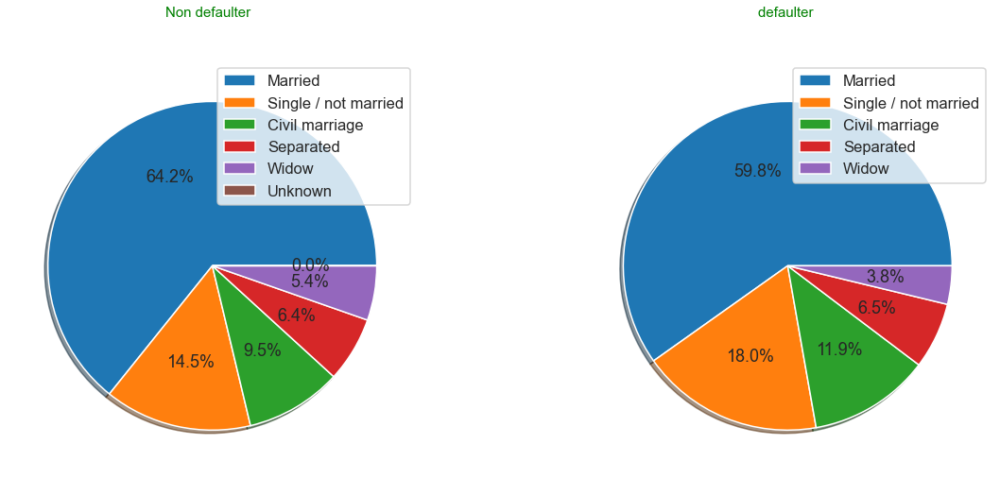

In [55]:
# Family status of defaulters and non-defaulters

plt.figure(figsize=[20,8])


plt.subplot(1,2,1)
plt.pie(target0_curapp['NAME_FAMILY_STATUS'].value_counts(),shadow=True,autopct='%1.1f%%')
plt.title("Non defaulter  \n", fontdict={'fontsize': 15, 'fontweight' : 5, 'color' : 'Green'})
plt.legend(target0_curapp['NAME_FAMILY_STATUS'].value_counts().index)




plt.subplot(1,2,2)
plt.pie(target1_curapp['NAME_FAMILY_STATUS'].value_counts(),shadow=True,autopct='%1.1f%%')
plt.title("defaulter \n", fontdict={'fontsize': 15, 'fontweight' : 5, 'color' : 'Green'})
plt.legend(target1_curapp['NAME_FAMILY_STATUS'].value_counts().index)
plt.show()

Non defaulters have slightly higher marriage percentage while defaulters have higher single percentage

#### 3.2 Bivariate & Multivariate analysis

In [56]:
target0_curapp.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,YEARS_BIRTH,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,YEARS_BIRTH_RANGE,AMT_INCOME_RANGE,AMT_CREDIT_RANGE
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,45.9,3.3,3.2,0.8,Core staff,MONDAY,11,0,0,0,0,0,0,School,0.622246,NaN,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Middle Age,Very high,Very high
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,52.2,0.6,11.7,6.9,Laborers,MONDAY,9,0,0,0,0,0,0,Government,0.555912,0.729567,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Middle Age,Very Low,Very Low
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,52.1,8.3,26.9,6.7,Laborers,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.650442,NaN,2.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Middle Age,Low,Low
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,54.6,8.3,11.8,9.5,Core staff,THURSDAY,11,0,0,0,0,1,1,Religion,0.322738,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Middle Age,Low,Medium
5,100008,0,Cash loans,M,N,Y,0,99000.0,490495.5,27517.5,454500.0,"Spouse, partner",State servant,Secondary / secondary special,Married,House / apartment,0.035792,46.4,4.4,13.6,1.3,Laborers,WEDNESDAY,16,0,0,0,0,0,0,Other,0.354225,0.621226,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,Middle Age,Very Low,Medium


In [57]:
target1_curapp.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,YEARS_BIRTH,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,YEARS_BIRTH_RANGE,AMT_INCOME_RANGE,AMT_CREDIT_RANGE
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,25.9,1.7,10.0,5.8,Laborers,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,2.0,2.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,1.0,Young Adult,High,Low
26,100031,1,Cash loans,F,N,Y,0,112500.0,979992.0,27076.5,702000.0,Unaccompanied,Working,Secondary / secondary special,Widow,House / apartment,0.018029,51.3,7.2,18.0,5.0,Cooking staff,MONDAY,9,0,0,0,0,0,0,Business Entity Type 3,0.548477,0.190706,10.0,1.0,10.0,0.0,0.0,0.0,0.0,0.0,2.0,2.0,Middle Age,Low,Very high
40,100047,1,Cash loans,M,N,Y,0,202500.0,1193580.0,35028.0,855000.0,Unaccompanied,Commercial associate,Secondary / secondary special,Married,House / apartment,0.025164,47.9,3.5,3.2,2.8,Laborers,TUESDAY,9,0,0,0,0,0,0,Business Entity Type 3,0.306841,0.320163,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,4.0,Middle Age,High,Very high
42,100049,1,Cash loans,F,N,N,0,135000.0,288873.0,16258.5,238500.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.007305,36.7,9.9,0.1,12.1,Sales staff,THURSDAY,11,0,0,0,0,0,0,Self-employed,0.674203,0.399676,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,Young Adult,Low,Low
81,100096,1,Cash loans,F,N,Y,0,81000.0,252000.0,14593.5,252000.0,Unaccompanied,Pensioner,Secondary / secondary special,Married,House / apartment,0.028663,67.9,1000.7,14.8,11.5,NaN,THURSDAY,10,0,0,0,0,0,0,NaN,0.023952,0.720944,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,Senior Citizen,Very Low,Very Low


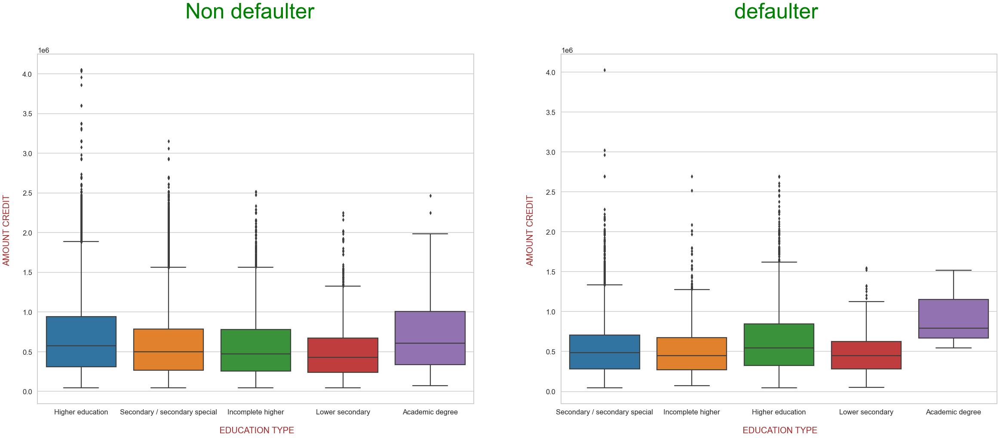

In [58]:
# Box plot between amount credit and education type

plt.figure(figsize=[40,15])


plt.subplot(1,2,1)
sns.boxplot(x = target0_curapp['NAME_EDUCATION_TYPE'],y = target0_curapp['AMT_CREDIT'])
plt.title("Non defaulter  \n", fontdict={'fontsize': 50, 'fontweight' : 5, 'color' : 'Green'})
plt.xlabel("\n EDUCATION TYPE", fontdict={'fontsize': 20, 'fontweight' : 5, 'color' : 'Brown'})
plt.ylabel("AMOUNT CREDIT \n", fontdict={'fontsize': 20, 'fontweight' : 5, 'color' : 'Brown'})


plt.subplot(1,2,2)
sns.boxplot(x = target1_curapp['NAME_EDUCATION_TYPE'],y = target1_curapp['AMT_CREDIT'])
plt.title("defaulter \n", fontdict={'fontsize': 50, 'fontweight' : 5, 'color' : 'Green'})
plt.xlabel("\n EDUCATION TYPE", fontdict={'fontsize': 20, 'fontweight' : 5, 'color' : 'Brown'})
plt.ylabel("AMOUNT CREDIT \n", fontdict={'fontsize': 20, 'fontweight' : 5, 'color' : 'Brown'})

plt.show()

Both defaulters and non defaulters have high credits for Higher education and Academic degree, and that no defaulter with academic degree has ever asked for less than 500,000 in credit.

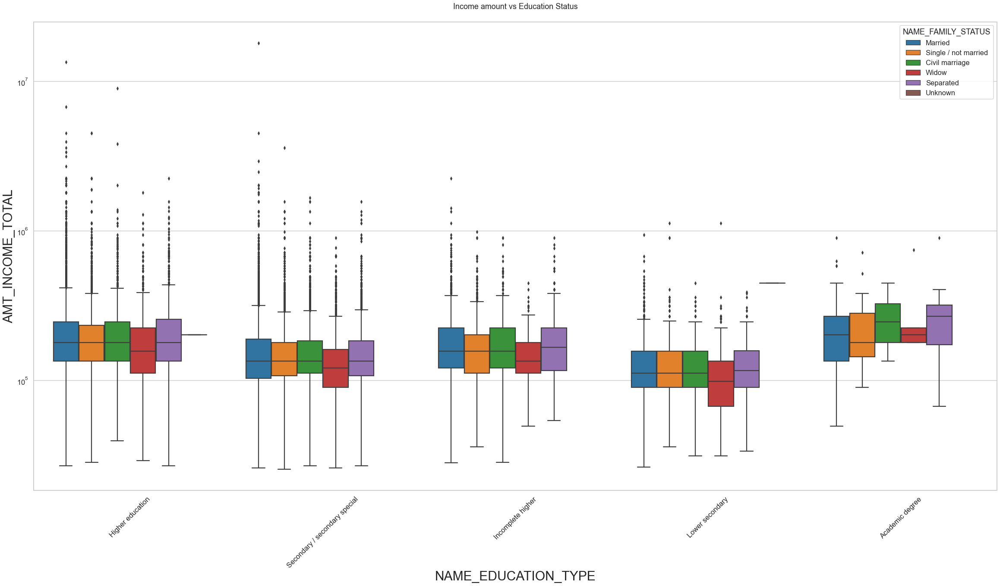

In [59]:
# Box plotting for Income amount in logarithmic scale

plt.figure(figsize=(40,20))
plt.xticks(rotation=45)
plt.yscale('log')
sns.boxplot(data =target0_curapp, x='NAME_EDUCATION_TYPE',y='AMT_INCOME_TOTAL',hue='NAME_FAMILY_STATUS',orient='v')
plt.title('Income amount vs Education Status')
plt.show()

From above boxplot for Education type 'Higher Education' the income amount is mostly equal with family status. It does contain many outliers. Less outlier are having for Academic degree but there income amount is little higher that Higher education. Lower secondary of civil marriage family status are have less income amount than others.

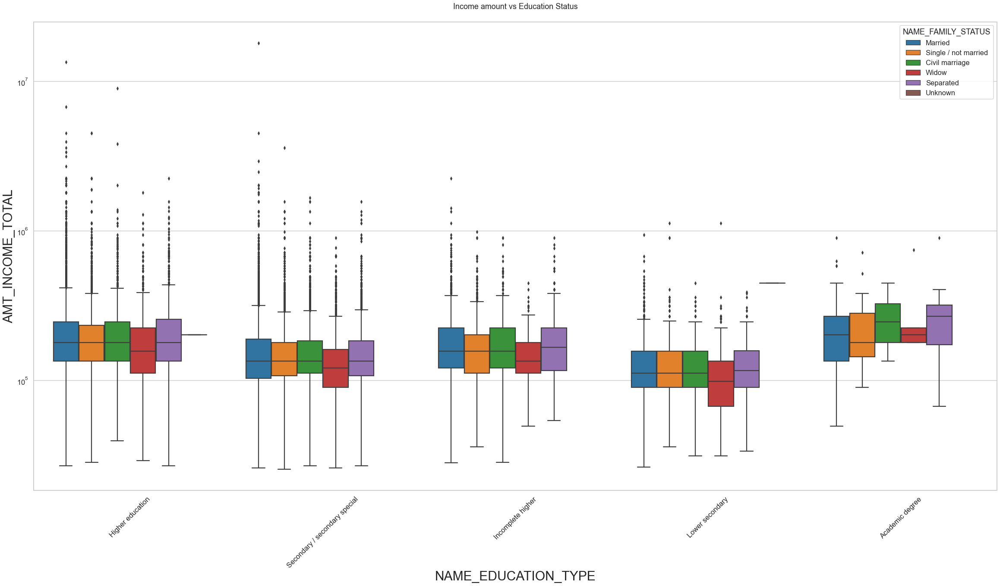

In [60]:
# Box plotting for Income amount in logarithmic scale

plt.figure(figsize=(40,20))
plt.xticks(rotation=45)
plt.yscale('log')
sns.boxplot(data =target0_curapp, x='NAME_EDUCATION_TYPE', y='AMT_INCOME_TOTAL',hue='NAME_FAMILY_STATUS',orient='v')
plt.title('Income amount vs Education Status')
plt.show()

Have some similarity with Non-Defaulters, From above boxplot for Education type 'Higher education ' the income amount is mostly equal with family status. Less outlier are having for Academic degree but there income amount is little higher that Higher education.Lower secondary are have less income amount than others.

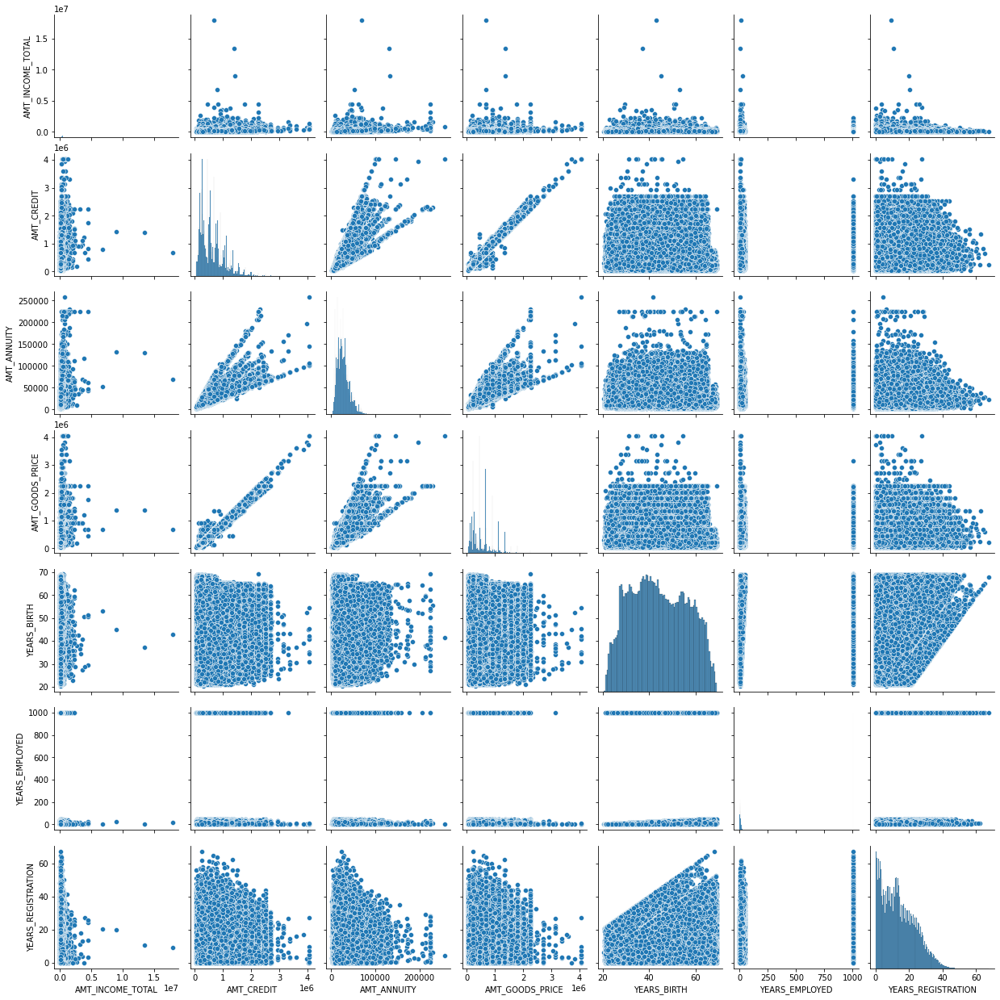

In [61]:
# Pair plot for non-defaulters using our custom function

def prplt(x,l):
    sns.reset_orig()
    pr = x[l]
    sns.pairplot(pr)
    plt.show()


prplt(target0_curapp,['AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'YEARS_BIRTH', 'YEARS_EMPLOYED', 'YEARS_REGISTRATION'])

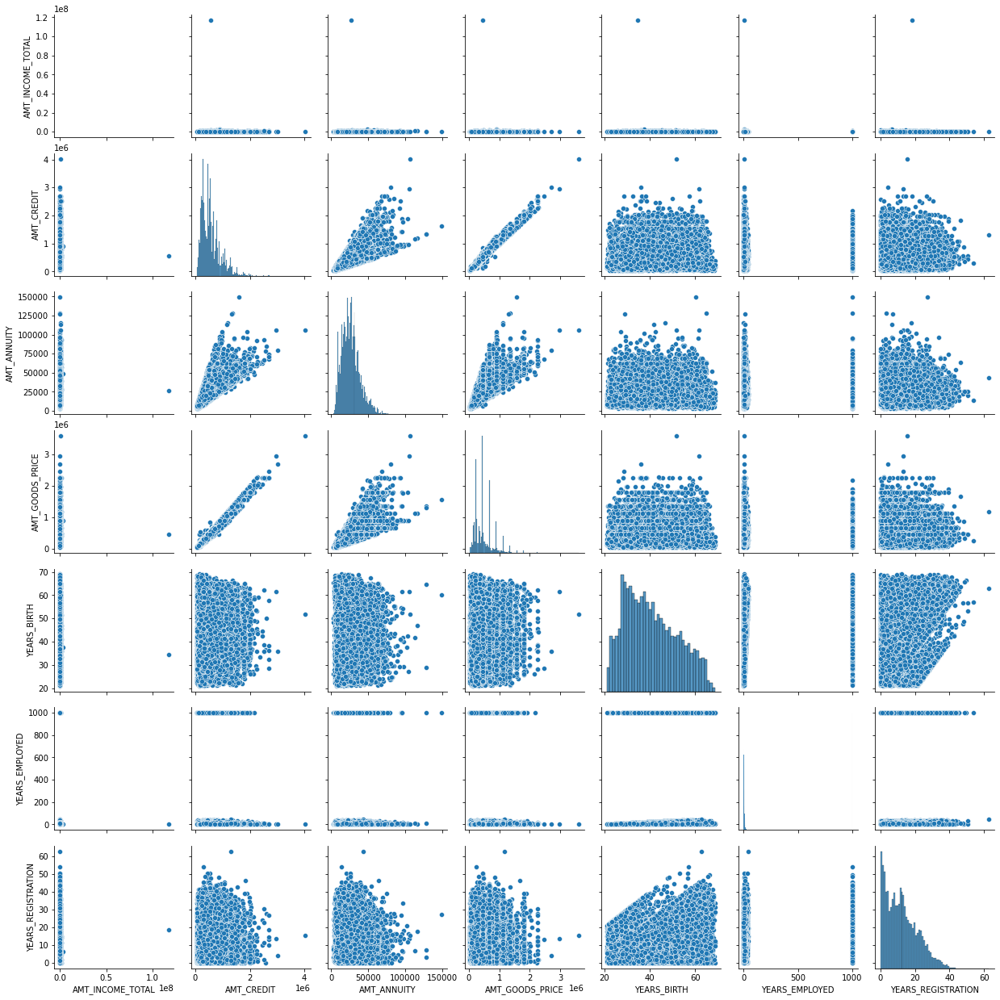

In [62]:
# Pair plot for defaulters using our custom function


prplt(target1_curapp,['AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'YEARS_BIRTH', 'YEARS_EMPLOYED', 'YEARS_REGISTRATION'])

From the plot it is evident that `top correlations` between these metrics are as follows - :


- `Amount of credit and Amount of goods price`,

- `Amount of credit and Amount of Annuity`,

- `Amount of Annuity and Amount of goods price`.

While Years Birth and Years Registration do have some correlation but nothing too significant.

Also all these metrics are same for both defaulters and non-defaulters.

In [63]:
# Finding some correlation for numerical columns for both target 0 and 1

target0_corr=target0_curapp.iloc[0:,2:]
target1_corr=target1_curapp.iloc[0:,2:]

target0=target0_corr.corr(method='spearman')
target1=target1_corr.corr(method='spearman')

In [64]:
# Correlation for target 0

target0

,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,YEARS_BIRTH,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
CNT_CHILDREN,1.000000,0.038308,0.002315,0.024767,-0.001320,-0.025551,-0.375644,-0.205713,-0.180511,0.019973,0.001725,-0.010738,0.015455,0.021523,0.027788,0.076212,0.071585,-0.016823,-0.046237,0.022594,-0.001227,0.022261,-0.001691,0.001811,0.001281,0.000192,0.002290,-0.003248,-0.026532
AMT_INCOME_TOTAL,0.038308,1.000000,0.416017,0.485689,0.419720,0.097772,-0.093508,-0.095911,-0.076382,-0.035937,0.102384,0.078372,0.161441,0.148976,0.020368,0.040087,0.040321,0.179612,-0.094709,-0.029821,-0.033058,-0.029555,-0.034187,0.004858,0.007828,0.014120,0.080292,0.039395,0.086848
AMT_CREDIT,0.002315,0.416017,1.000000,0.831885,0.984995,0.053570,0.057146,0.017981,-0.009410,0.001993,0.051370,0.019093,0.045430,0.047740,-0.026649,-0.012662,0.006972,0.128247,0.018912,0.004327,-0.015078,0.004398,-0.018235,-0.002022,0.001634,-0.001306,0.049048,0.030665,-0.007678
AMT_ANNUITY,0.024767,0.485689,0.831885,1.000000,0.829802,0.058591,-0.011743,-0.030206,-0.037710,-0.016584,0.054189,0.035819,0.075773,0.073042,-0.004962,0.009718,0.019451,0.129206,0.014992,-0.007941,-0.017900,-0.007722,-0.020250,0.003789,0.002964,0.012250,0.049528,0.024084,0.010513
AMT_GOODS_PRICE,-0.001320,0.419720,0.984995,0.829802,1.000000,0.062625,0.058337,0.022713,-0.009495,0.004051,0.058858,0.020404,0.046368,0.048044,-0.028154,-0.015466,0.004666,0.136429,0.024054,0.003323,-0.016314,0.003433,-0.019047,-0.001176,0.001899,-0.000712,0.049997,0.031556,-0.008790
REGION_POPULATION_RELATIVE,-0.025551,0.097772,0.053570,0.058591,0.062625,1.000000,0.030726,-0.003628,0.036678,0.010446,0.128237,-0.019922,0.029206,0.051195,-0.045545,-0.029350,-0.005476,0.185952,-0.005901,0.010703,0.028014,0.011268,0.023408,-0.004295,-0.000743,-0.004613,0.043757,-0.001594,0.002343
YEARS_BIRTH,-0.375644,-0.093508,0.057146,-0.011743,0.058337,0.030726,1.000000,0.583711,0.298129,0.261965,-0.098436,-0.066371,-0.096422,-0.070069,-0.180951,-0.239116,-0.156593,0.089025,0.196952,-0.021497,-0.000402,-0.021125,-0.002300,-0.003022,-0.001497,0.004296,-0.005068,0.017660,0.067741
YEARS_EMPLOYED,-0.205713,-0.095911,0.017981,-0.030206,0.022713,-0.003628,0.583711,1.000000,0.201303,0.259873,-0.084427,-0.071262,-0.137894,-0.112810,-0.145580,-0.262866,-0.198822,0.049410,0.159560,-0.000396,0.008632,-0.000369,0.006128,0.000539,0.001432,0.005514,0.000612,0.019526,0.054399
YEARS_REGISTRATION,-0.180511,-0.076382,-0.009410,-0.037710,-0.009495,0.036678,0.298129,0.201303,1.000000,0.094153,0.008467,-0.025935,-0.032729,-0.024172,-0.055298,-0.085866,-0.062447,0.059068,0.101762,-0.013380,-0.002403,-0.013227,-0.003569,0.003284,0.001361,0.002295,0.005517,-0.000038,0.017473
YEARS_ID_PUBLISH,0.019973,-0.035937,0.001993,-0.016584,0.004051,0.010446,0.261965,0.259873,0.094153,1.000000,-0.039739,-0.035380,-0.049201,-0.034791,-0.077358,-0.101041,-0.062973,0.043068,0.126594,0.004257,-0.001935,0.004816,-0.004583,-0.002070,0.002397,0.007855,0.020765,0.024436,0.064419


In [65]:
# Correlation for target 1

target1

,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,YEARS_BIRTH,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
CNT_CHILDREN,1.000000,-0.004749,0.000200,0.033679,-0.007564,-0.031628,-0.267861,-0.127989,-0.133662,0.027230,-0.022469,-0.025824,-0.019571,-0.009823,0.004127,0.047486,0.051352,-0.015875,-0.022055,0.032145,-0.003296,0.031349,-0.005557,0.001279,-0.009282,-0.002377,-0.008096,-0.009292,-0.016182
AMT_INCOME_TOTAL,-0.004749,1.000000,0.359276,0.431617,0.362476,0.051463,0.007229,-0.036152,-0.036670,0.005954,0.088174,0.076449,0.156053,0.144970,0.008996,0.027994,0.030864,0.145262,-0.067438,0.000842,-0.019239,0.000884,-0.023243,0.013234,0.001488,0.025341,0.089531,0.042510,0.117046
AMT_CREDIT,0.000200,0.359276,1.000000,0.811443,0.976430,0.039919,0.155236,0.082425,0.017093,0.053802,0.028537,0.014192,0.030331,0.032564,-0.028544,-0.029571,-0.011182,0.111837,0.072975,0.019686,-0.021312,0.019540,-0.028423,0.004793,-0.002350,0.007337,0.050261,-0.005418,0.010402
AMT_ANNUITY,0.033679,0.431617,0.811443,1.000000,0.804099,0.023297,0.030500,-0.003380,-0.035908,0.014505,0.032083,0.030930,0.063880,0.062370,-0.002849,0.007397,0.014922,0.110147,0.037340,0.009017,-0.019458,0.009831,-0.026152,0.013673,-0.003329,0.028728,0.061814,0.001132,0.007919
AMT_GOODS_PRICE,-0.007564,0.362476,0.976430,0.804099,1.000000,0.054091,0.157735,0.092630,0.019169,0.059722,0.040018,0.016967,0.033713,0.034974,-0.030196,-0.032537,-0.012539,0.123547,0.078733,0.021405,-0.018918,0.021279,-0.025695,0.007777,-0.002403,0.008069,0.053588,-0.002226,0.011833
REGION_POPULATION_RELATIVE,-0.031628,0.051463,0.039919,0.023297,0.054091,1.000000,0.046396,0.020020,0.034306,0.023629,0.105989,-0.032472,-0.009009,0.010621,-0.057083,-0.044331,-0.016447,0.145746,-0.012031,0.030727,0.048842,0.030434,0.038901,-0.004486,0.001562,-0.000196,0.047921,-0.008910,0.018378
YEARS_BIRTH,-0.267861,0.007229,0.155236,0.030500,0.157735,0.046396,1.000000,0.466553,0.232960,0.251652,-0.065819,-0.055826,-0.064524,-0.039901,-0.165351,-0.203413,-0.108990,0.120517,0.168222,-0.006409,-0.011818,-0.005937,-0.013468,-0.012583,0.000740,0.006945,0.004789,0.019241,0.086751
YEARS_EMPLOYED,-0.127989,-0.036152,0.082425,-0.003380,0.092630,0.020020,0.466553,1.000000,0.148919,0.209982,-0.043252,-0.075516,-0.118445,-0.090232,-0.144213,-0.249639,-0.167583,0.071736,0.117724,0.012206,-0.003717,0.012279,-0.003985,-0.008370,0.002700,0.007000,0.004963,0.008167,0.068492
YEARS_REGISTRATION,-0.133662,-0.036670,0.017093,-0.035908,0.019169,0.034306,0.232960,0.148919,1.000000,0.095798,0.032010,-0.015271,-0.014309,-0.010316,-0.033900,-0.071378,-0.052804,0.070011,0.078984,-0.021278,-0.010802,-0.021006,-0.008567,0.002042,0.003065,-0.003200,-0.010897,0.007837,0.012401
YEARS_ID_PUBLISH,0.027230,0.005954,0.053802,0.014505,0.059722,0.023629,0.251652,0.209982,0.095798,1.000000,-0.026422,-0.032695,-0.032822,-0.019929,-0.068568,-0.070823,-0.031388,0.060736,0.126955,0.013875,-0.007659,0.013303,-0.006588,0.000447,0.015156,0.003503,0.024207,0.009513,0.081777


In [66]:
# Now, plotting the above correlation with heat map as it is the best choice to visualise

# figure size

def targets_corr(data,title, x,y):
    sns.reset_orig()
    plt.figure(figsize=(x, y))
    plt.tick_params(axis='x', labelsize=25)
    plt.tick_params(axis='y', labelsize=25)
    
# heatmap with a color map of choice


    sns.heatmap(data, cmap = 'coolwarm',annot=True, fmt = '.2g',annot_kws={"size":20})
    
    plt.title(title, fontdict={'fontsize': 30, 'fontweight' : 5, 'color' : 'Green'})
    plt.yticks(rotation=0)
    plt.show()

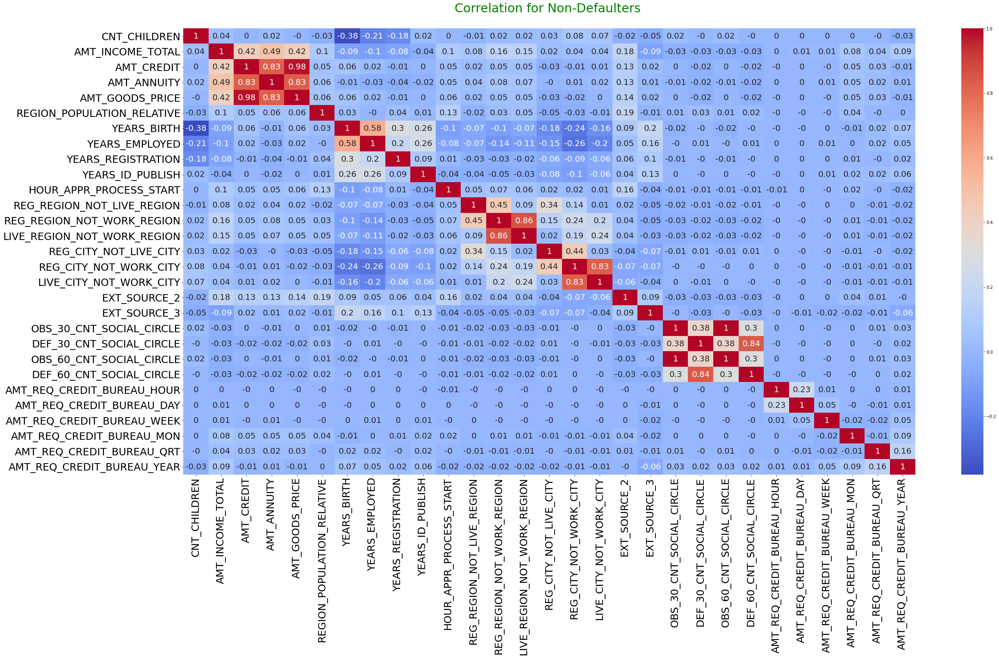

In [67]:
# For Target 0

targets_corr(data=round(target0,2),title='Correlation for Non-Defaulters \n',x = 40, y = 20)

As we can see from above correlation heatmap, There are number of observation we can point out

1. Credit amount is inversely proportional to  the date of birth, which means credit amount is higher for low age and vice-versa
2. Credit amount is inversely prportional to the number of children client have, means Credit amount is higher for less children count client have and vice-versa.

3. Income amount is inversely proportional to the number of children client have, means more income for less children client have and vice-versa.

4. less children client have in densely populated area.

5. Credit amount is higher to densely populated area.

6. The income is also higher in densely populated area.


also top 5 correlation for Non-defaulters are as follows,
​
- Between Amount credit and amount of goods price,
- Between Amount credit and amount of annuity,
- Between Amount annuity and amount of goods price
- Between number of observation of client's social surroundings defaulted on 30 DPD and 60 DPD &
- Between (Working city not being working city) and (Living city not being working city)




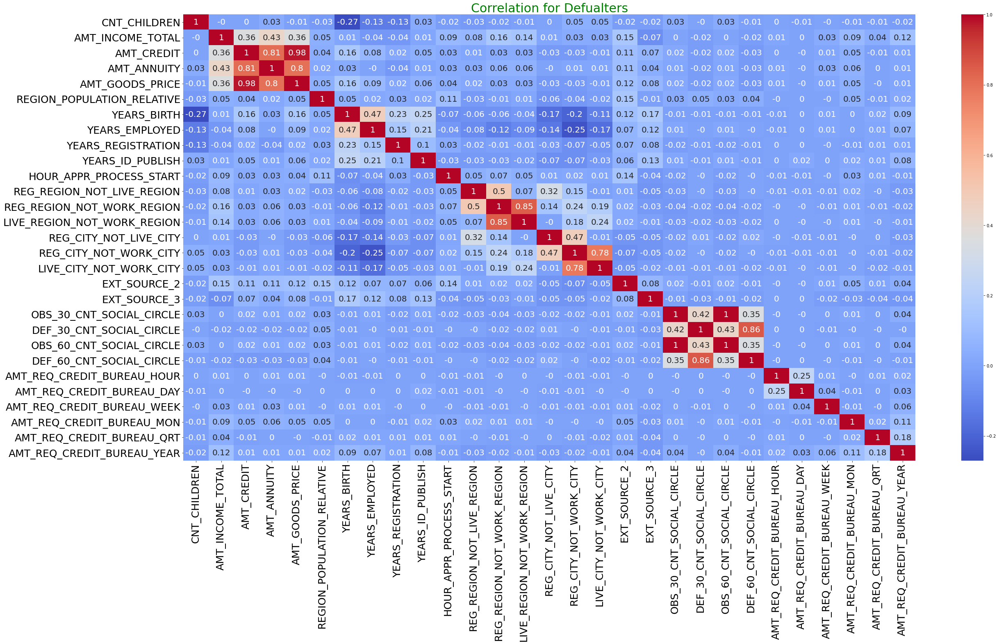

In [68]:
# for Target 1

targets_corr(data=round(target1,2),title='Correlation for Defualters',x = 40, y = 20)

This heat map for Defaulters is also having quite a same observation just like Non-defaulters. But for few points are different. They are listed below.

1. The client's permanent address does not match contact address are having less children and vice-versa.

2. The client's permanent address does not match work address are having less children and vice-versa

also top 5 correlation for Defaulters are as follows,

- Between Amount credit and amount of goods price,
- Between Amount credit and amount of annuity,
- Between Amount annuity and amount of goods price
- Between (Working city not being working city) and (Living city not being working city)
- Between (Working address not being working address) and (Living region not being working region)


## 4. Previous Application Dataset

###  4.1 Reading the dataset of previous application

In [69]:
# Reading the dataset of previous application

preapp=pd.read_csv("previous_application.csv")

In [70]:
preapp.shape  # Checking its shape

(1670214, 37)

In [71]:
preapp.head() # Checking the head/top 5 rows

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [72]:
preapp.info(verbose = True) # Checking column wise information

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 12  RATE_DOWN_PAYMENT            774370 non-nu

In [73]:
((preapp.isnull().sum()/preapp.shape[0])*100).sort_values(ascending = False) # Checking for Null values

RATE_INTEREST_PRIVILEGED       99.643698
RATE_INTEREST_PRIMARY          99.643698
RATE_DOWN_PAYMENT              53.636480
AMT_DOWN_PAYMENT               53.636480
NAME_TYPE_SUITE                49.119754
DAYS_TERMINATION               40.298129
NFLAG_INSURED_ON_APPROVAL      40.298129
DAYS_FIRST_DRAWING             40.298129
DAYS_FIRST_DUE                 40.298129
DAYS_LAST_DUE_1ST_VERSION      40.298129
DAYS_LAST_DUE                  40.298129
AMT_GOODS_PRICE                23.081773
AMT_ANNUITY                    22.286665
CNT_PAYMENT                    22.286366
PRODUCT_COMBINATION             0.020716
AMT_CREDIT                      0.000060
SK_ID_CURR                      0.000000
NAME_CONTRACT_TYPE              0.000000
WEEKDAY_APPR_PROCESS_START      0.000000
HOUR_APPR_PROCESS_START         0.000000
FLAG_LAST_APPL_PER_CONTRACT     0.000000
NFLAG_LAST_APPL_IN_DAY          0.000000
AMT_APPLICATION                 0.000000
NAME_PAYMENT_TYPE               0.000000
NAME_CASH_LOAN_P

In [74]:
preapp.describe()  # Checking for Numerical summary

,SK_ID_PREV,SK_ID_CURR,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
count,1.670214e+06,1.670214e+06,1.297979e+06,1.670214e+06,1.670213e+06,7.743700e+05,1.284699e+06,1.670214e+06,1.670214e+06,774370.000000,5951.000000,5951.000000,1.670214e+06,1.670214e+06,1.297984e+06,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000
mean,1.923089e+06,2.783572e+05,1.595512e+04,1.752339e+05,1.961140e+05,6.697402e+03,2.278473e+05,1.248418e+01,9.964675e-01,0.079637,0.188357,0.773503,-8.806797e+02,3.139511e+02,1.605408e+01,342209.855039,13826.269337,33767.774054,76582.403064,81992.343838,0.332570
std,5.325980e+05,1.028148e+05,1.478214e+04,2.927798e+05,3.185746e+05,2.092150e+04,3.153966e+05,3.334028e+00,5.932963e-02,0.107823,0.087671,0.100879,7.790997e+02,7.127443e+03,1.456729e+01,88916.115834,72444.869708,106857.034789,149647.415123,153303.516729,0.471134
min,1.000001e+06,1.000010e+05,0.000000e+00,0.000000e+00,0.000000e+00,-9.000000e-01,0.000000e+00,0.000000e+00,0.000000e+00,-0.000015,0.034781,0.373150,-2.922000e+03,-1.000000e+00,0.000000e+00,-2922.000000,-2892.000000,-2801.000000,-2889.000000,-2874.000000,0.000000
25%,1.461857e+06,1.893290e+05,6.321780e+03,1.872000e+04,2.416050e+04,0.000000e+00,5.084100e+04,1.000000e+01,1.000000e+00,0.000000,0.160716,0.715645,-1.300000e+03,-1.000000e+00,6.000000e+00,365243.000000,-1628.000000,-1242.000000,-1314.000000,-1270.000000,0.000000
50%,1.923110e+06,2.787145e+05,1.125000e+04,7.104600e+04,8.054100e+04,1.638000e+03,1.123200e+05,1.200000e+01,1.000000e+00,0.051605,0.189122,0.835095,-5.810000e+02,3.000000e+00,1.200000e+01,365243.000000,-831.000000,-361.000000,-537.000000,-499.000000,0.000000
75%,2.384280e+06,3.675140e+05,2.065842e+04,1.803600e+05,2.164185e+05,7.740000e+03,2.340000e+05,1.500000e+01,1.000000e+00,0.108909,0.193330,0.852537,-2.800000e+02,8.200000e+01,2.400000e+01,365243.000000,-411.000000,129.000000,-74.000000,-44.000000,1.000000
max,2.845382e+06,4.562550e+05,4.180581e+05,6.905160e+06,6.905160e+06,3.060045e+06,6.905160e+06,2.300000e+01,1.000000e+00,1.000000,1.000000,1.000000,-1.000000e+00,4.000000e+06,8.400000e+01,365243.000000,365243.000000,365243.000000,365243.000000,365243.000000,1.000000


###  4.2 Cleaning the dataset of previous application

In [75]:
# Cleaning the missing data

# Removing the columns having more than 40% null values using the function we defined earlier

rem40(curapp)

In [76]:
# Checking the Shape again


preapp.shape

(1670214, 37)

In [77]:
# Replacing the column values of 'XNA' and 'XAP' with np.NaN

preapp = preapp.replace('XNA', np.NaN)
preapp = preapp.replace('XAP', np.NaN)



In [78]:
preapp.head()   # Checking the head/top 5 rows

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182832,0.867336,NaN,Approved,-73,Cash through the bank,NaN,NaN,Repeater,Mobile,POS,NaN,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,NaN,Approved,-164,NaN,NaN,Unaccompanied,Repeater,NaN,Cash,x-sell,Contact center,-1,NaN,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,NaN,Approved,-301,Cash through the bank,NaN,"Spouse, partner",Repeater,NaN,Cash,x-sell,Credit and cash offices,-1,NaN,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,NaN,Approved,-512,Cash through the bank,NaN,NaN,Repeater,NaN,Cash,x-sell,Credit and cash offices,-1,NaN,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,NaN,Cash,walk-in,Credit and cash offices,-1,NaN,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


###  4.3 Univariate Analysis of previous application dataset

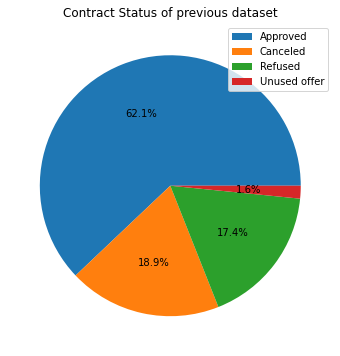

In [79]:
# Piechart on Contract status of previous dataset

plt.figure(figsize=(12,6))
plt.title('Contract Status of previous dataset')
a = preapp['NAME_CONTRACT_STATUS'].value_counts()
plt.pie(a,autopct='%1.1f%%')
plt.legend(a.index)

plt.show()

`As we can observe very few of the applicants actually didn't use the offer`

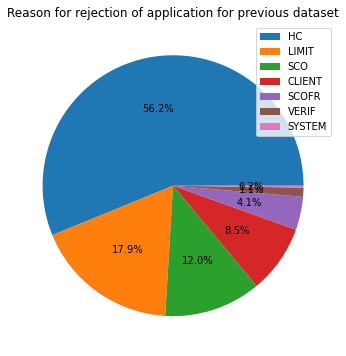

In [80]:
# Piechart on Reason for rejection of application for previous dataset


plt.figure(figsize=(12,6))
plt.title('Reason for rejection of application for previous dataset')
a = preapp['CODE_REJECT_REASON'].value_counts()
plt.pie(a,autopct='%1.1f%%')
plt.legend(a.index)

plt.show()

`Most people were rejected because of 'HC'`

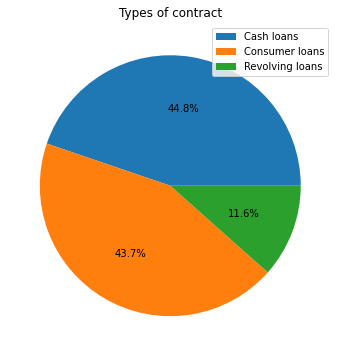

In [81]:
# Countplot for various types of Loans

plt.figure(figsize=(12,6))
plt.title('Types of contract')
a = preapp['NAME_CONTRACT_TYPE'].value_counts()
plt.pie(a,autopct='%1.1f%%')
plt.legend(a.index)

plt.show()


`As we can see majority of loans are of either Cash type or consumer type, with very few as Revolving type`

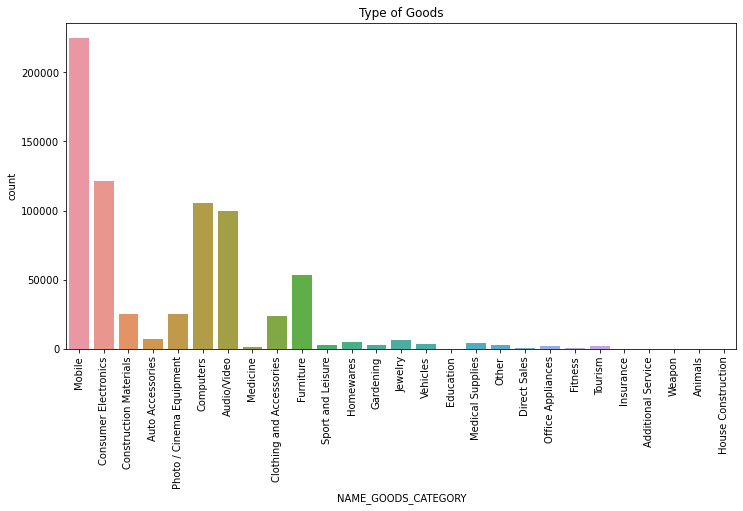

In [82]:
# Barchart for types of goods for which Person applied for loan

plt.figure(figsize=(12,6))
plt.title('Type of Goods')
sns.countplot(x="NAME_GOODS_CATEGORY",data=preapp)
plt.xticks(rotation=90)
plt.show()

As we can see majority of goods for which the client applied the loan for were mobiles, consumer electronics, computers and audio/video

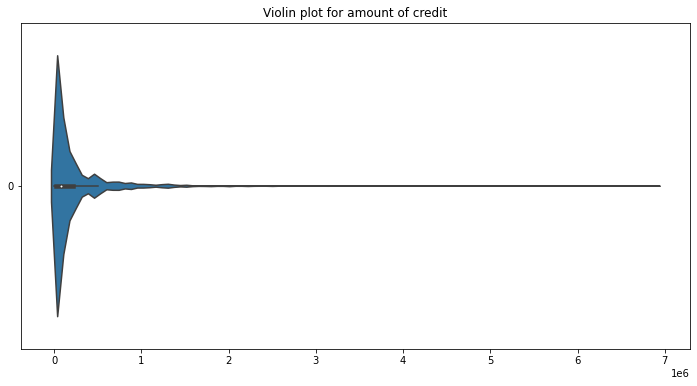

In [83]:
# 'Violin plot for amount of credit'


plt.figure(figsize=(12,6))
plt.title('Violin plot for amount of credit')
sns.violinplot(data = preapp['AMT_CREDIT'], orient = 'h' )
plt.show()


There are some outliers, but nothing out of ordinary

###  4.4 Merging of previous and current application dataset

In [84]:
# Before Merging we will add '_PREV' as suffix on all columns of our Previous dataset so as to eliminate any confusion
for i in preapp.columns:
    if 'PREV' not in i and i!= 'SK_ID_CURR': # For columns like SK_ID_PREV ( or SK_ID_CURR cause its foreign key) which already contain PREV we need not add the suffix
        preapp = preapp.rename(columns = {i : i + '_PREV'})

In [85]:
# Now merging the Application dataset with Previous Application dataset
newapp=pd.merge(left=curapp,right=preapp,how='inner',on='SK_ID_CURR',suffixes='_x')

In [86]:
# Renaming the column names after merging, so as to eliminate any confusion

newapp1 = newapp.rename({'NAME_CONTRACT_TYPE_' : 'NAME_CONTRACT_TYPE','AMT_CREDIT_':'AMT_CREDIT','AMT_ANNUITY':'AMT_ANNUITY','WEEKDAY_APPR_PROCESS_START_':'WEEKDAY_APPR_PROCESS_START','HOUR_APPR_PROCESS_START_':'HOUR_APPR_PROCESS_START','NAME_CONTRACT_TYPEx':'NAME_CONTRACT_TYPE_PREV','AMT_CREDITx':'AMT_CREDIT_PREV','AMT_ANNUITYx':'AMT_ANNUITY_PREV','WEEKDAY_APPR_PROCESS_STARTx':'WEEKDAY_APPR_PROCESS_START_PREV','HOUR_APPR_PROCESS_STARTX':'HOUR_APPR_PROCESS_START_PREV'},axis=1)

In [87]:
newapp1.shape # Checking shape

(1413701, 82)

In [88]:
newapp1.head() # Checking head

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,YEARS_BIRTH,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,YEARS_BIRTH_RANGE,AMT_INCOME_RANGE,AMT_CREDIT_RANGE,SK_ID_PREV,NAME_CONTRACT_TYPE_PREV,AMT_ANNUITY_PREV,AMT_APPLICATION_PREV,AMT_CREDIT_PREV,AMT_DOWN_PAYMENT_PREV,AMT_GOODS_PRICE_PREV,WEEKDAY_APPR_PROCESS_START_PREV,HOUR_APPR_PROCESS_START_PREV,FLAG_LAST_APPL_PER_CONTRACT_PREV,NFLAG_LAST_APPL_IN_DAY_PREV,RATE_DOWN_PAYMENT_PREV,RATE_INTEREST_PRIMARY_PREV,RATE_INTEREST_PRIVILEGED_PREV,NAME_CASH_LOAN_PURPOSE_PREV,NAME_CONTRACT_STATUS_PREV,DAYS_DECISION_PREV,NAME_PAYMENT_TYPE_PREV,CODE_REJECT_REASON_PREV,NAME_TYPE_SUITE_PREV,NAME_CLIENT_TYPE_PREV,NAME_GOODS_CATEGORY_PREV,NAME_PORTFOLIO_PREV,NAME_PRODUCT_TYPE_PREV,CHANNEL_TYPE_PREV,SELLERPLACE_AREA_PREV,NAME_SELLER_INDUSTRY_PREV,CNT_PAYMENT_PREV,NAME_YIELD_GROUP_PREV,PRODUCT_COMBINATION_PREV,DAYS_FIRST_DRAWING_PREV,DAYS_FIRST_DUE_PREV,DAYS_LAST_DUE_1ST_VERSION_PREV,DAYS_LAST_DUE_PREV,DAYS_TERMINATION_PREV,NFLAG_INSURED_ON_APPROVAL_PREV
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,25.9,1.7,10.0,5.8,Laborers,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.262949,0.139376,2.0,2.0,2.0,2.0,0.0,0.0,0.0,0.0,0.0,1.0,Young Adult,High,Low,1038818,Consumer loans,9251.775,179055.0,179055.0,0.0,179055.0,SATURDAY,9,Y,1,0.000000,NaN,NaN,NaN,Approved,-606,NaN,NaN,NaN,New,Vehicles,POS,NaN,Stone,500,Auto technology,24.0,low_normal,POS other with interest,365243.0,-565.0,125.0,-25.0,-17.0,0.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,45.9,3.3,3.2,0.8,Core staff,MONDAY,11,0,0,0,0,0,0,School,0.622246,NaN,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Middle Age,Very high,Very high,1810518,Cash loans,98356.995,900000.0,1035882.0,NaN,900000.0,FRIDAY,12,Y,1,NaN,NaN,NaN,NaN,Approved,-746,NaN,NaN,Unaccompanied,Repeater,NaN,Cash,x-sell,Credit and cash offices,-1,NaN,12.0,low_normal,Cash X-Sell: low,365243.0,-716.0,-386.0,-536.0,-527.0,1.0
2,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,45.9,3.3,3.2,0.8,Core staff,MONDAY,11,0,0,0,0,0,0,School,0.622246,NaN,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Middle Age,Very high,Very high,2636178,Consumer loans,64567.665,337500.0,348637.5,0.0,337500.0,SUNDAY,17,Y,1,0.000000,NaN,NaN,NaN,Approved,-828,Cash through the bank,NaN,Family,Refreshed,Furniture,POS,NaN,Stone,1400,Furniture,6.0,middle,POS industry with interest,365243.0,-797.0,-647.0,-647.0,-639.0,0.0
3,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,45.9,3.3,3.2,0.8,Core staff,MONDAY,11,0,0,0,0,0,0,School,0.622246,NaN,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Middle Age,Very high,Very high,2396755,Consumer loans,6737.310,68809.5,68053.5,6885.0,68809.5,SATURDAY,15,Y,1,0.100061,NaN,NaN,NaN,Approved,-2341,Cash through the bank,NaN,Family,Refreshed,Consumer Electronics,POS,NaN,Country-wide,200,Consumer electronics,12.0,middle,POS household with interest,365243.0,-2310.0,-1980.0,-1980.0,-1976.0,1.0
4,1

In [89]:
newapp1.describe() # Checking Numerical summary

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,YEARS_BIRTH,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,SK_ID_PREV,AMT_ANNUITY_PREV,AMT_APPLICATION_PREV,AMT_CREDIT_PREV,AMT_DOWN_PAYMENT_PREV,AMT_GOODS_PRICE_PREV,HOUR_APPR_PROCESS_START_PREV,NFLAG_LAST_APPL_IN_DAY_PREV,RATE_DOWN_PAYMENT_PREV,RATE_INTEREST_PRIMARY_PREV,RATE_INTEREST_PRIVILEGED_PREV,DAYS_DECISION_PREV,SELLERPLACE_AREA_PREV,CNT_PAYMENT_PREV,DAYS_FIRST_DRAWING_PREV,DAYS_FIRST_DUE_PREV,DAYS_LAST_DUE_1ST_VERSION_PREV,DAYS_LAST_DUE_PREV,DAYS_TERMINATION_PREV,NFLAG_INSURED_ON_APPROVAL_PREV
count,1.413701e+06,1.413701e+06,1.413701e+06,1.413701e+06,1.413701e+06,1.413701e+06,1.413701e+06,1.413701e+06,1.413701e+06,1.413701e+06,1.413701e+06,1.413701e+06,1.413701e+06,1.413701e+06,1.413701e+06,1.413701e+06,1.413701e+06,1.413701e+06,1.413701e+06,1.413701e+06,1.171859e+06,1.413701e+06,1.413701e+06,1.413701e+06,1.413701e+06,1.413701e+06,1.413701e+06,1.413701e+06,1.413701e+06,1.413701e+06,1.413701e+06,1.413701e+06,1.106483e+06,1.413701e+06,1.413700e+06,6.641610e+05,1.094176e+06,1.413701e+06,1.413701e+06,664161.000000,4791.000000,4791.000000,1.413701e+06,1.413701e+06,1.106488e+06,852595.000000,852595.000000,852595.000000,852595.000000,852595.000000,852595.000000
mean,2.784813e+05,8.655296e-02,4.048933e-01,1.731208e+05,5.875537e+05,2.701688e+04,5.276522e+05,2.074985e-02,4.471524e+01,1.897315e+01,1.370756e+01,8.313882e+00,1.198433e+01,1.207327e-02,4.396686e-02,3.604793e-02,7.360538e-02,2.221481e-01,1.740601e-01,5.114978e-01,4.896986e-01,1.540740e+00,1.537008e-01,1.522906e+00,1.078021e-01,5.484894e-03,6.028149e-03,3.410198e-02,2.664913e-01,3.196935e-01,2.575495e+00,1.922744e+06,1.583718e+04,1.752436e+05,1.963541e+05,6.655317e+03,2.264512e+05,1.247893e+01,9.964321e-01,0.080175,0.189436,0.771284,-8.803670e+02,3.149878e+02,1.605194e+01,342257.656710,13488.741567,33274.831806,76665.634755,82353.171672,0.330572
std,1.028118e+05,2.811789e-01,7.173454e-01,1.085174e+05,3.849173e+05,1.395072e+04,3.531028e+05,1.334702e-02,1.190294e+01,2.563639e+01,9.729112e+00,4.129993e+00,3.232181e+00,1.092132e-01,2.050215e-01,1.864095e-01,2.611277e-01,4.156903e-01,3.791613e-01,1.910056e-01,1.965360e-01,2.528944e+00,4.654353e-01,2.507192e+00,3.786711e-01,7.702591e-02,1.001966e-01,2.012902e-01,9.268428e-01,8.781444e-01,2.268756e+00,5.327153e+05,1.472491e+04,2.936222e+05,3.194813e+05,2.062030e+04,3.159376e+05,3.331474e+00,5.962560e-02,0.107784,0.090849,0.100644,7.835402e+02,7.695082e+03,1.456675e+01,88832.266598,71650.147146,106161.775933,149704.716371,153537.064274,0.470419
min,1.000020e+05,0.000000e+00,0.000000e+00,2.565000e+04,4.500000e+04,1.615500e+03,4.050000e+04,2.900000e-04,2.050000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,8.173617e-08,5.272652e-04,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000001e+06,0.000000e+00,0.000000e+00,0.000000e+00,-9.000000e-01,0.000000e+00,0.000000e+00,0.000000e+00,-0.000015,0.034781,0.373150,-2.922000e+03,-1.000000e+00,0.000000e+00,-2922.000000,-2892.000000,-2801.000000,-2889.000000,-2874.000000,0.000000
25%,1.893640e+05,0.000000e+00,0.000000e+00,1.125000e+05,2.700000e+05,1.682100e+04,2.385000e+05,1.003200e-02,3.490000e+01,2.900000e+00,5.500000e+00,4.900000e+00,1.000000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,3.893855e-01,3.441550e-

In [90]:
newapp1.info(verbose = True) # Checking column wise information

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1413701 entries, 0 to 1413700
Data columns (total 82 columns):
 #   Column                            Non-Null Count    Dtype   
---  ------                            --------------    -----   
 0   SK_ID_CURR                        1413701 non-null  int64   
 1   TARGET                            1413701 non-null  int64   
 2   NAME_CONTRACT_TYPE                1413701 non-null  object  
 3   CODE_GENDER                       1413701 non-null  object  
 4   FLAG_OWN_CAR                      1413701 non-null  object  
 5   FLAG_OWN_REALTY                   1413701 non-null  object  
 6   CNT_CHILDREN                      1413701 non-null  int64   
 7   AMT_INCOME_TOTAL                  1413701 non-null  float64 
 8   AMT_CREDIT                        1413701 non-null  float64 
 9   AMT_ANNUITY                       1413701 non-null  float64 
 10  AMT_GOODS_PRICE                   1413701 non-null  float64 
 11  NAME_TYPE_SUITE         

Since our merged dataset comprises of both previous and current dataset, univariate analysis would be the same as it was for thier individual analysis

###  4.5 Bivariate and Multivariate Analysis of Merged application dataset

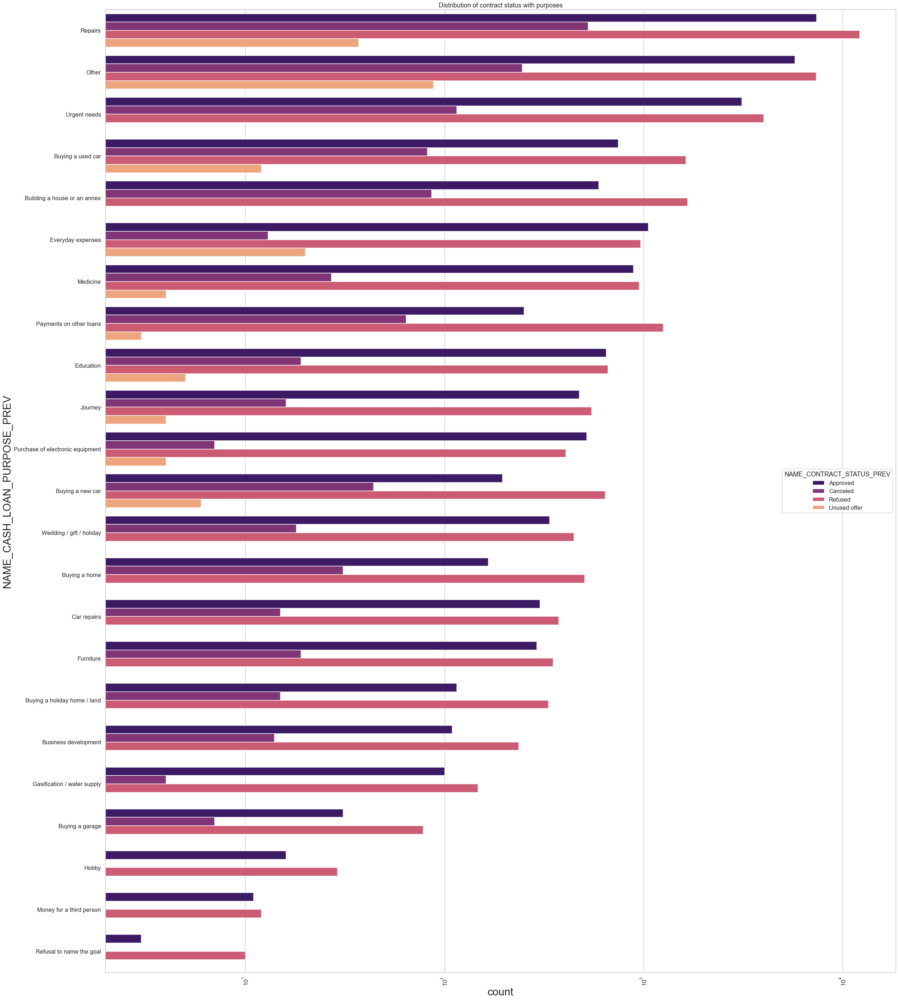

In [91]:
# Distribution of contract status in logarthmic scale

sns.set_style('whitegrid')
sns.set_context('talk')

plt.figure(figsize=(40,50))
plt.rc('axes', labelsize = 20)
plt.rc('axes', labelsize = 22)
plt.rc('axes', labelsize = 30)
plt.xticks(rotation=90)
plt.xscale('log')
plt.title('Distribution of contract status with purposes')
ax = sns.countplot(data=newapp1,y='NAME_CASH_LOAN_PURPOSE_PREV',order=newapp1['NAME_CASH_LOAN_PURPOSE_PREV'].value_counts().index,hue = 'NAME_CONTRACT_STATUS_PREV',palette='magma')


Points to be concluded from above plot:
 1. `Most rejection of cash loans came from purpose 'repairs'` 
 2. For education purposes we have equal number of approves and rejection
 3. `Paying other loans and buying a new car is having significant higher rejection than approves.`
 


In [92]:
# Dividing the merged dataset into two dataset of target=1(client with payment difficulties i.e Defaulters) and target=0(all other i.e non-defaulters)

t_0 = newapp1[newapp1['TARGET']==0]
t_1 = newapp1[newapp1['TARGET']==1]

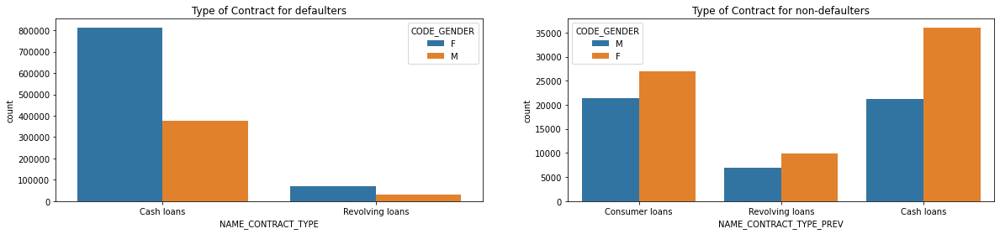

In [93]:
# Barplot for contract type for Non-Defaulters and Defaulters based on gender

plt.figure(figsize=(20,4))

sns.reset_orig()

plt.subplot(1,2,1)
plt.title('Type of Contract for defaulters')
sns.countplot(x="NAME_CONTRACT_TYPE",hue = 'CODE_GENDER',data=t_0)

plt.subplot(1,2,2)
plt.title('Type of Contract for non-defaulters')
sns.countplot(x="NAME_CONTRACT_TYPE_PREV",hue = 'CODE_GENDER',data=t_1)


plt.show()

As we can see, Females again have more loans for all categories  

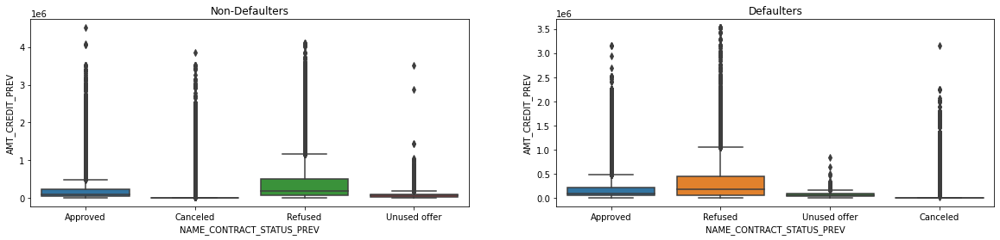

In [94]:
# Boxplot for Contract status and Amount of credit

plt.figure(figsize=(20,4))


plt.subplot(1,2,1)
plt.title('Non-Defaulters')
sns.boxplot(x='NAME_CONTRACT_STATUS_PREV',y='AMT_CREDIT_PREV',data=t_0)
    
plt.subplot(1,2,2)    
plt.title('Defaulters')
sns.boxplot(x='NAME_CONTRACT_STATUS_PREV',y='AMT_CREDIT_PREV',data=t_1)
    
plt.show()

Here it is evident that both defaulters and non-defaulters who were Refused the most had requested higher credits than thier counterparts

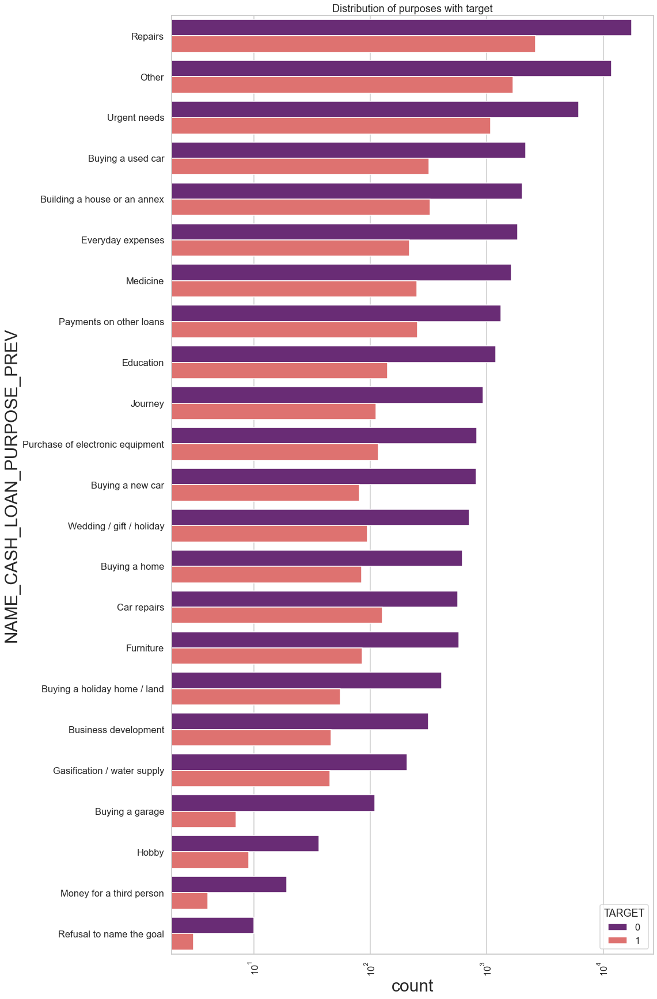

In [95]:
# Distribution of Cash loan purpose

sns.set_style('whitegrid')
sns.set_context('talk')

plt.figure(figsize=(15,30))
plt.rc('axes', labelsize = 20)
plt.rc('axes', labelsize = 22)
plt.rc('axes', labelsize = 30)
plt.xticks(rotation=90)
plt.xscale('log')
plt.title('Distribution of purposes with target')
ax = sns.countplot(data=newapp1,y='NAME_CASH_LOAN_PURPOSE_PREV',order=newapp1['NAME_CASH_LOAN_PURPOSE_PREV'].value_counts().index,hue = 'TARGET',palette='magma')



Few points we can conclude from above plot:
    
1. Loan purposes with 'Repairs' are facing more difficulties in paying on time.
    
2. There are few places where loan payment is significant higher than facing difficulties. They are 'Buying a garage','Business development','Buying land','Buying a new car' and 'Education'.Hence we can focus on these purposes for which the client is having for minimal payment difficulties.

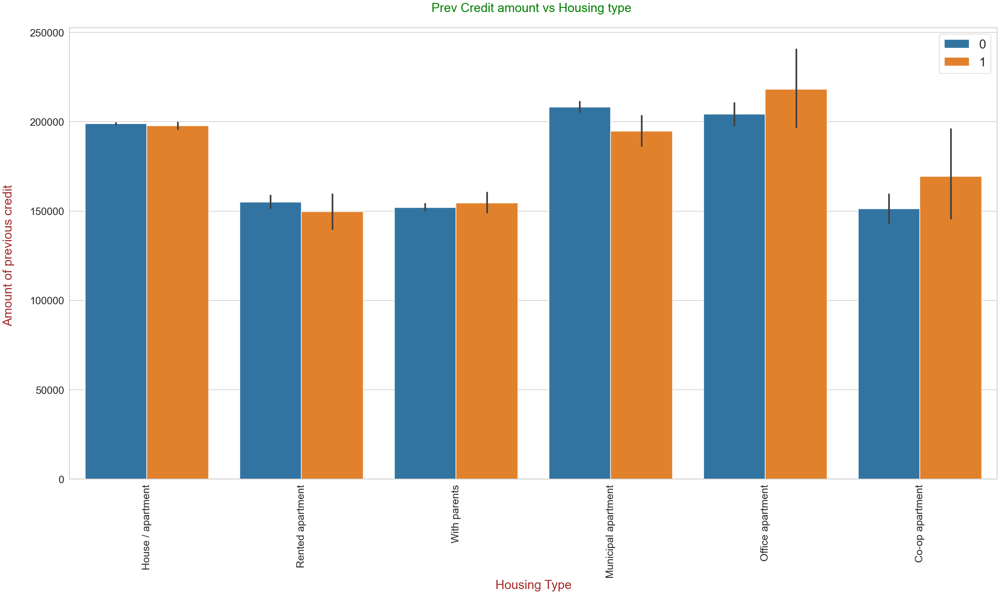

In [96]:
# Barplot for Credit amount prev vs Housing type in logarithmic scale

plt.figure(figsize=(40,20))
plt.xticks(rotation=90)
plt.tick_params(axis='x', labelsize=25)
plt.tick_params(axis='y', labelsize=25)
sns.barplot(data =newapp1, y='AMT_CREDIT_PREV',hue='TARGET',x='NAME_HOUSING_TYPE')
plt.title('Prev Credit amount vs Housing type \n', fontdict={'fontsize': 30, 'fontweight' : 5, 'color' : 'Green'})
plt.xlabel("Housing Type", fontdict={'fontsize': 30, 'fontweight' : 5, 'color' : 'Brown'})
plt.ylabel("Amount of previous credit \n", fontdict={'fontsize': 30, 'fontweight' : 5, 'color' : 'Brown'})
plt.legend(loc=1, prop={'size': 30})
plt.show()

Here for `Housing type, office appartment is having higher credit of Non-Defaulters` and `co-op apartment is having higher credit of Defaulters`. So, we can conclude that bank should avoid giving loans to the housing type of co-op apartment as they are having difficulties in payment.Bank can focus mostly on housing type with parents or House/appartment or municipal appartments for successful payments.

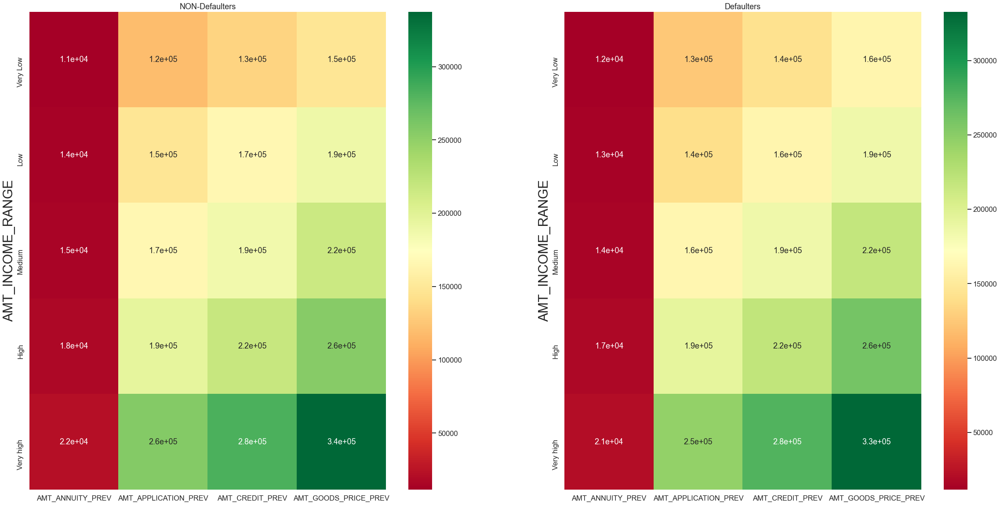

In [97]:
# Heatmaps for all Amount related columns for Defaulters and non-defaulters


plt.figure(figsize=[40,20])

plt.subplot(1,2,1)
plt.title('NON-Defaulters') 
x = pd.pivot_table(data=t_0,values=['AMT_APPLICATION_PREV','AMT_CREDIT_PREV', 'AMT_ANNUITY_PREV', 'AMT_GOODS_PRICE_PREV'],index="AMT_INCOME_RANGE",aggfunc=np.mean)
sns.heatmap(x,annot=True,cmap="RdYlGn")

plt.subplot(1,2,2)
plt.title('Defaulters') 
y = pd.pivot_table(data=t_1,values=['AMT_APPLICATION_PREV','AMT_CREDIT_PREV', 'AMT_ANNUITY_PREV', 'AMT_GOODS_PRICE_PREV'],index="AMT_INCOME_RANGE",aggfunc=np.mean)
sns.heatmap(y,annot=True,cmap="RdYlGn")

plt.show()

`We can conclude from this plot that for defaulters all attributes of Amount are higher than that of Non-defaulters in case of low income group, while the opoosite is true for clients in very high income group.`

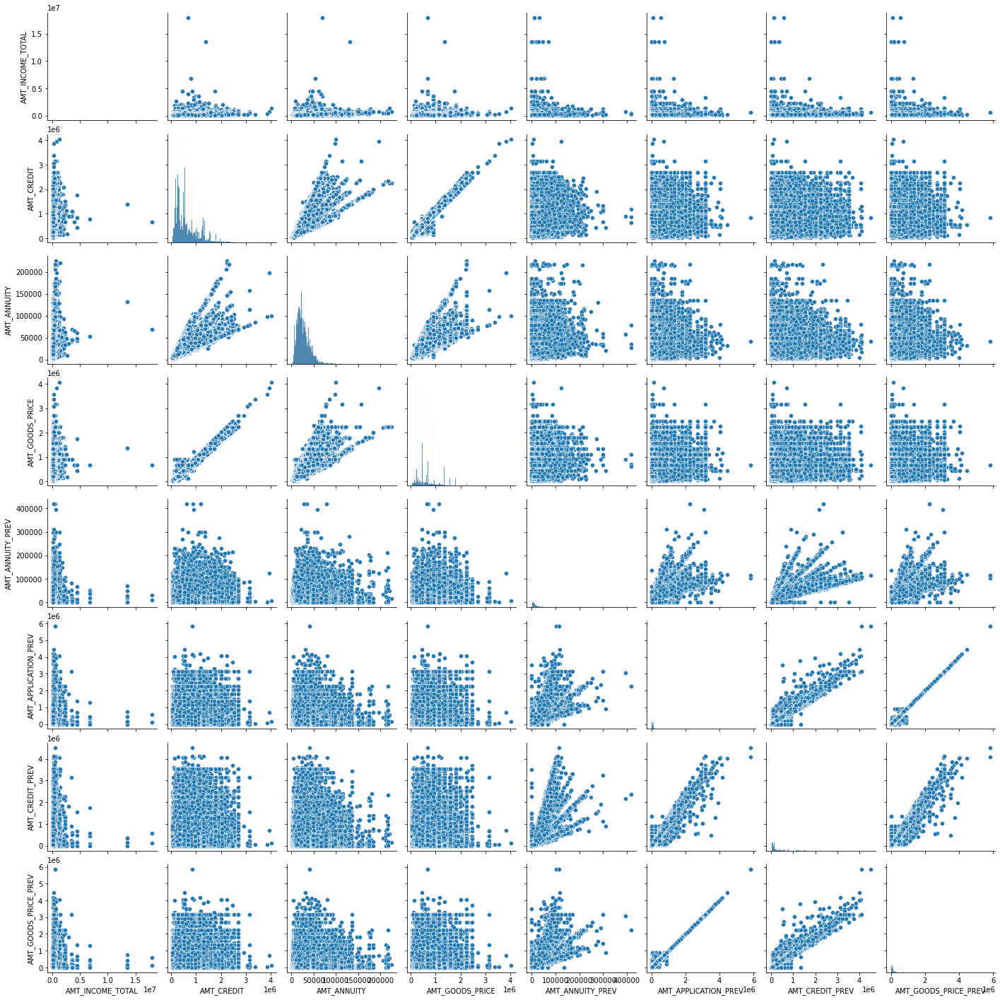

In [98]:
# Pairplot for all Amount related columns for Non-Defaulters


sns.reset_orig()
sns.pairplot(t_0[['AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'AMT_ANNUITY_PREV', 'AMT_APPLICATION_PREV', 'AMT_CREDIT_PREV','AMT_GOODS_PRICE_PREV']].fillna(0))
plt.show()

Top 5 correlations for Non-Defaulters are - :

1. Amount of credit and Amount of goods price,

2. Amount of credit and Amount of Annuity,

3. Amount of Annuity and Amount of goods price

4. Amount of Credit asked by client previously and Currently

5. Amount of Credit asked by client previously and Amount of price of goods previously


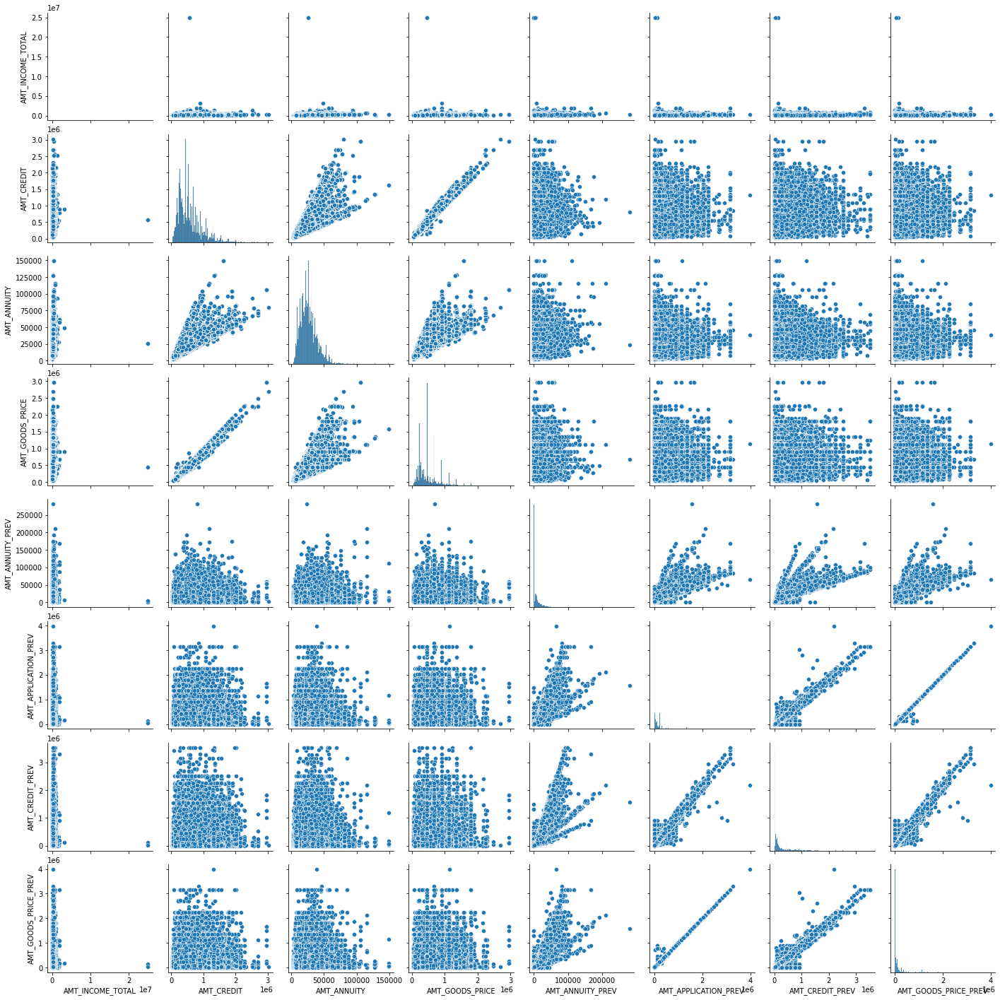

In [99]:
# Pairplot for all Amount related columns for Defaulters

sns.reset_orig()
sns.pairplot(t_1[['AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'AMT_ANNUITY_PREV', 'AMT_APPLICATION_PREV', 'AMT_CREDIT_PREV','AMT_GOODS_PRICE_PREV']].fillna(0))
plt.show()

We can see that there is a high relation between amount of credit ,price of goods and amount the client asked,

Also, Top 5 correlations for Defaulters are - :

1. Amount of credit and Amount of goods price,

2. Amount of credit and Amount of Annuity,

3. Amount of Annuity and Amount of goods price

4. Amount of Credit asked by client previously and Currently

5. Amount of Credit asked by client previously and Amount of price of goods previously

In [100]:
t_0_corr=t_0.iloc[0:,2:]      # Making a correlation Matrix for target variables 0 and 1
t_1_corr=t_1.iloc[0:,2:]

t_0=t_0_corr.corr(method='spearman')
t_1=t_1_corr.corr(method='spearman')

In [101]:
t_0 # Checking the correlation matrix for target variable 0

,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,YEARS_BIRTH,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,SK_ID_PREV,AMT_ANNUITY_PREV,AMT_APPLICATION_PREV,AMT_CREDIT_PREV,AMT_DOWN_PAYMENT_PREV,AMT_GOODS_PRICE_PREV,HOUR_APPR_PROCESS_START_PREV,NFLAG_LAST_APPL_IN_DAY_PREV,RATE_DOWN_PAYMENT_PREV,RATE_INTEREST_PRIMARY_PREV,RATE_INTEREST_PRIVILEGED_PREV,DAYS_DECISION_PREV,SELLERPLACE_AREA_PREV,CNT_PAYMENT_PREV,DAYS_FIRST_DRAWING_PREV,DAYS_FIRST_DUE_PREV,DAYS_LAST_DUE_1ST_VERSION_PREV,DAYS_LAST_DUE_PREV,DAYS_TERMINATION_PREV,NFLAG_INSURED_ON_APPROVAL_PREV
CNT_CHILDREN,1.000000,0.029429,0.005973,0.033787,0.002313,-0.023407,-0.411874,-0.226941,-0.184352,0.003700,0.007748,-0.005615,0.021327,0.024132,0.039884,0.085071,0.074201,-0.021213,-0.047422,0.025336,0.000046,0.024977,-0.001620,0.000972,-0.000627,0.003044,-0.000047,-0.012617,-0.062118,-0.003233,-0.063928,-0.029386,-0.034544,0.008692,-0.085009,0.029439,0.002403,0.015545,-0.028706,-0.001559,-0.016758,0.078729,-0.062656,-0.000555,0.009179,-0.017264,-0.009309,-0.008958,-0.063880
AMT_INCOME_TOTAL,0.029429,1.000000,0.394113,0.466665,0.394894,0.085269,-0.076116,-0.084539,-0.064813,-0.039486,0.099101,0.067714,0.143584,0.132021,0.015103,0.037074,0.038827,0.162766,-0.103000,-0.020526,-0.028950,-0.020166,-0.030201,0.004856,0.008109,0.014624,0.076523,0.035559,0.090621,0.003330,0.218659,0.088871,0.095254,0.069965,0.191355,0.108504,0.000869,0.032853,-0.046310,-0.048478,0.014186,-0.059629,0.034598,-0.026739,-0.007239,0.023004,0.001996,0.003173,0.008176
AMT_CREDIT,0.005973,0.394113,1.000000,0.825297,0.984856,0.049261,0.039795,0.010060,-0.011317,-0.014308,0.047857,0.018120,0.042191,0.043975,-0.022504,-0.007336,0.008894,0.114755,0.014943,0.009793,-0.013238,0.010087,-0.017139,-0.003108,0.001474,-0.003930,0.048141,0.032500,-0.018049,-0.000038,0.125604,0.070295,0.078610,0.059302,0.114578,0.046175,0.000013,0.038334,-0.058189,-0.089506,-0.053099,0.004296,0.023767,-0.021224,-0.064008,-0.022895,-0.056249,-0.048448,-0.017108
AMT_ANNUITY,0.033787,0.466665,0.825297,1.000000,0.822962,0.054073,-0.037382,-0.045937,-0.046162,-0.035462,0.055460,0.036777,0.074193,0.069979,0.001022,0.017215,0.023189,0.111937,-0.001935,-0.001964,-0.015580,-0.001390,-0.018422,0.002645,0.002650,0.008932,0.041961,0.012005,-0.005391,0.000637,0.167436,0.077679,0.079839,0.068045,0.131569,0.063085,0.001149,0.036535,-0.059694,-0.069393,-0.041222,0.002958,-0.006259,-0.008887,-0.044685,-0.029665,-0.047383,-0.043401,-0.012443
AMT_GOODS_PRICE,0.002313,0.394894,0.984856,0.822962,1.000000,0.058114,0.040415,0.014746,-0.011823,-0.012078,0.054712,0.018863,0.042271,0.043596,-0.023916,-0.009984,0.006738,0.121179,0.020053,0.010155,-0.013562,0.010490,-0.017006,-0.002204,0.001710,-0.003260,0.048473,0.033096,-0.020121,-0.000178,0.126112,0.072110,0.078583,0.059666,0.113696,0.051389,0.000549,0.038783,-0.064293,-0.093737,-0.054783,0.009926,0.021856,-0.014661,-0.063701,-0.026690,-0.058379,-0.051193,-0.021312
REGION_POPULATION_RELATIVE,-0.023407,0.085269,0.049261,0.054073,0.058114,1.000000,0.037248,0.004412,0.034399,0.013589,0.116120,-0.022720,0.024254,0.044467,-0.046772,-0.025947,-0.002957,0.175288,-0.008569,0.016117,0.028522,0.016885,0.025206,-0.005190,0.001236,-0.003502,0.045501,0.001120,0.006164,0.001735,0.044496,0.022077,0.024826,0.012285,0.033650,0.112841,-0.000870,0.009361,-0.012368,-0.028815,-0.034054,-0.018606,-0.002286,-0.000917,-0.046142,-0.035176,-0.039853,-0.038571,0.024368
YEARS_BIRTH,-0.411874,-0.076116,0.039795,-0.037382,0.040415,0.037248,1

In [102]:
t_1 # Checking the correlation matrix for target variable 1

,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,YEARS_BIRTH,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,SK_ID_PREV,AMT_ANNUITY_PREV,AMT_APPLICATION_PREV,AMT_CREDIT_PREV,AMT_DOWN_PAYMENT_PREV,AMT_GOODS_PRICE_PREV,HOUR_APPR_PROCESS_START_PREV,NFLAG_LAST_APPL_IN_DAY_PREV,RATE_DOWN_PAYMENT_PREV,RATE_INTEREST_PRIMARY_PREV,RATE_INTEREST_PRIVILEGED_PREV,DAYS_DECISION_PREV,SELLERPLACE_AREA_PREV,CNT_PAYMENT_PREV,DAYS_FIRST_DRAWING_PREV,DAYS_FIRST_DUE_PREV,DAYS_LAST_DUE_1ST_VERSION_PREV,DAYS_LAST_DUE_PREV,DAYS_TERMINATION_PREV,NFLAG_INSURED_ON_APPROVAL_PREV
CNT_CHILDREN,1.000000,-0.013704,-0.003683,0.036422,-0.011627,-0.025402,-0.318214,-0.149286,-0.139858,0.016295,-0.002354,-0.014287,-0.012975,-0.008228,0.015158,0.060927,0.060796,-0.021190,-0.029747,0.033047,0.000731,0.031604,-0.001842,0.006778,-0.014440,0.010935,-0.012611,-0.008106,-0.034775,-0.001915,-0.049873,-0.019569,-0.024776,-0.005550,-0.065278,0.008045,-0.002070,-0.001844,-0.056433,-0.027149,-0.009435,0.064181,-0.048239,0.002857,0.011332,-0.018653,-0.007304,-0.007344,-0.049154
AMT_INCOME_TOTAL,-0.013704,1.000000,0.321642,0.394459,0.322706,0.047977,0.024124,-0.031801,-0.028888,0.000367,0.083644,0.067930,0.136451,0.125221,0.005583,0.013334,0.014879,0.141332,-0.069713,0.004060,-0.010215,0.004138,-0.011759,0.007664,0.007415,0.021431,0.080460,0.036080,0.098238,0.003715,0.196387,0.072948,0.080549,0.062663,0.170703,0.087787,-0.000922,0.035490,-0.063361,-0.057940,-0.018028,-0.065920,0.038852,-0.015012,-0.033631,0.008284,-0.023169,-0.021960,0.021213
AMT_CREDIT,-0.003683,0.321642,1.000000,0.810103,0.976692,0.044553,0.130927,0.069418,0.012010,0.025575,0.024031,0.007953,0.020663,0.023561,-0.031653,-0.033501,-0.016108,0.094239,0.077625,0.020096,-0.015912,0.020233,-0.020340,0.006785,-0.006807,0.012866,0.050541,-0.018285,-0.024037,0.001229,0.104031,0.068395,0.076559,0.052999,0.091325,0.025720,-0.002911,0.044056,-0.028286,-0.102783,-0.103693,0.001779,0.029836,0.005188,-0.106421,-0.054849,-0.100046,-0.093837,0.009480
AMT_ANNUITY,0.036422,0.394459,0.810103,1.000000,0.802155,0.028513,0.005191,-0.017759,-0.047678,-0.012897,0.032112,0.030740,0.058299,0.053182,-0.003450,0.004773,0.009626,0.090140,0.026265,0.011232,-0.011734,0.012504,-0.014901,0.013039,0.004169,0.036558,0.051384,-0.020168,-0.027637,0.003574,0.127719,0.061497,0.063019,0.056052,0.095228,0.043714,-0.004146,0.035134,-0.020982,-0.073855,-0.079030,0.008288,0.001156,0.017258,-0.075201,-0.056378,-0.080019,-0.076161,-0.003129
AMT_GOODS_PRICE,-0.011627,0.322706,0.976692,0.802155,1.000000,0.058099,0.132480,0.082721,0.013960,0.029089,0.035791,0.008950,0.021917,0.024704,-0.033072,-0.036355,-0.017327,0.104343,0.083776,0.021573,-0.014100,0.021822,-0.018963,0.009403,-0.005167,0.013219,0.053325,-0.016572,-0.024620,0.000654,0.106681,0.072332,0.078990,0.053136,0.093384,0.032632,-0.001359,0.043660,-0.014420,-0.089596,-0.110181,0.006439,0.032228,0.011195,-0.110798,-0.060099,-0.105686,-0.099671,0.006484
REGION_POPULATION_RELATIVE,-0.025402,0.047977,0.044553,0.028513,0.058099,1.000000,0.051000,0.029136,0.025047,0.027296,0.106420,-0.036709,0.000541,0.020312,-0.058611,-0.042409,-0.012890,0.152785,-0.014584,0.027980,0.038921,0.027413,0.032068,-0.010303,-0.007718,0.005644,0.049547,-0.006307,0.007144,0.000660,0.022004,0.015963,0.018040,0.020404,0.015462,0.103568,0.000084,0.021724,-0.068791,-0.000268,-0.048549,-0.008041,-0.001315,0.005856,-0.064723,-0.047332,-0.058750,-0.056394,0.017801
YEARS_BIRTH,-0.318214,0.024124,0.130927,0.005191,0.132480,0.051000,1.

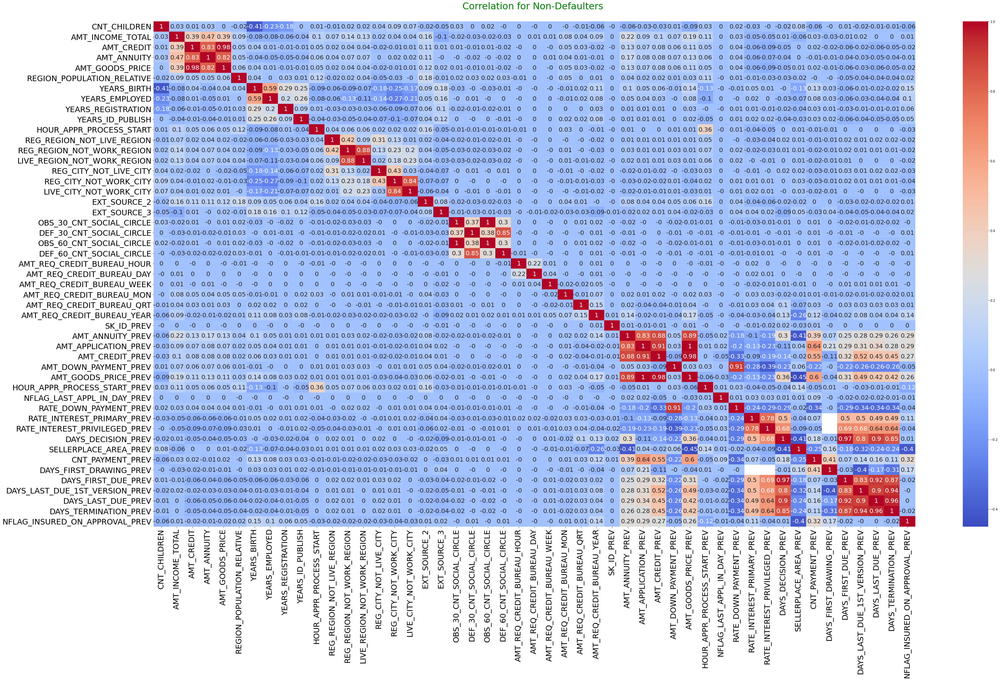

In [103]:
# For Target 0

targets_corr(data=round(t_0,2),title='Correlation for Non-Defaulters \n',x = 55, y = 30)

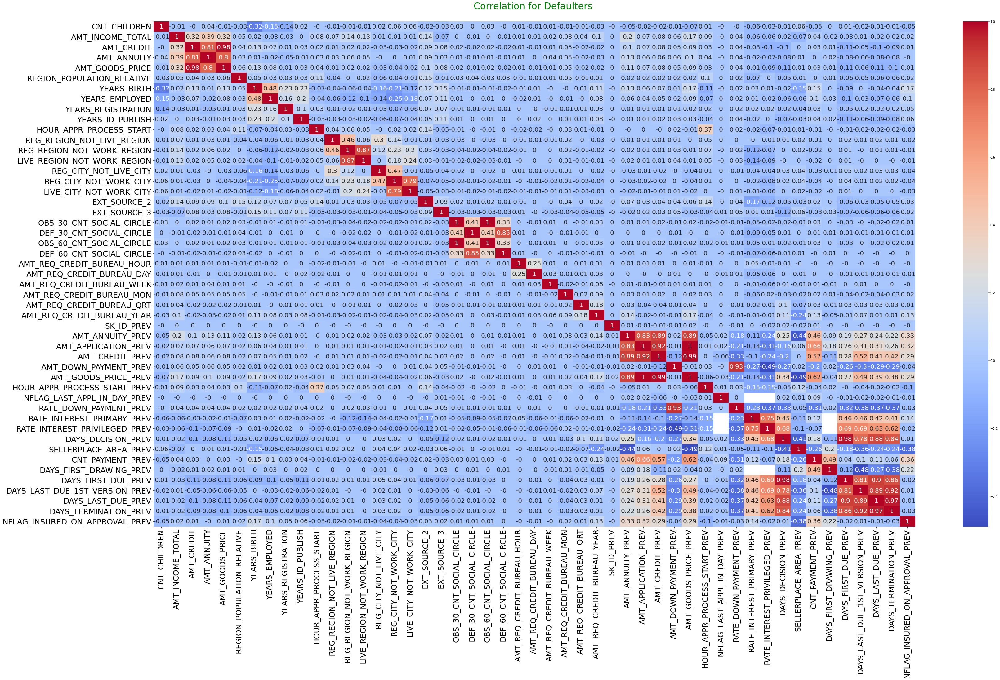

In [104]:
# For Target 1

targets_corr(data=round(t_1,2),title='Correlation for Defaulters \n',x = 55, y = 30)

Top 5 Correlation pairs are same for both Defaulters and Non-Defaulters (since they are same).

Which are as follows, -:
1. Amount of credit and Amount of goods price,

2. Amount of credit and Amount of Annuity,

3. Amount of Annuity and Amount of goods price

4. Amount of Credit asked by client previously and Currently

5. Amount of Credit asked by client previously and Amount of price of goods previously


# `CONCLUSION`

1. Banks should focus more on contract type 'Student', 'Pensioner' and 'Businessman' with housing 'type other than 'co-op apartment' for successful payments.

2. Banks should focus less on income type 'working' as they are having most number of unsuccessful payments.

3. Also with loan purpose 'Repair' is having higher number of unsuccessful payments on time.

4. Get as much as clients from housing type 'With parents' as they are having least number of unsuccessful payments.


#### `THESE ARE THE TYPE OF CUSTOMERS MOST LIKELY TO DEFAULT`

1. Mostly Single people,
2. Mostly adults and young adults,
3. Clients pursuing revolving loan are more likely to default than clients persuing other types of loans,
4. Clients with Secondary Education are more likely to be defaulters,
5. Clients having low income &
6. Clients who were rejected for the loan before



#### `THESE ARE THE TYPE OF CUSTOMERS LESS LIKELY TO DEFAULT`


1. Mostly married people
2. Mostly middle aged and senior citizens
3. Clients pursuing other types of loans rather than revolving loan
4. People with higher education
5. Clients having high income
6. Clients who were approved for the loan before
